<IPython.core.display.Javascript object>


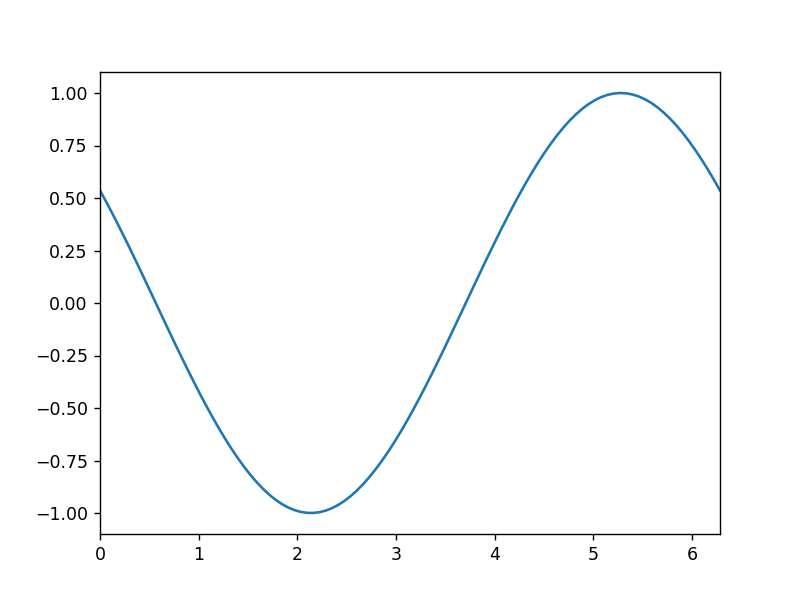

In [1]:
%matplotlib notebook
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from scipy.integrate import RK45 as rk4
import numpy as np
import math
import random
import numpy.random as rd

fig, ax = plt.subplots()
line, = ax.plot([])     # A tuple unpacking to unpack the only plot
ax.set_xlim(0, 2*np.pi)
ax.set_ylim(-1.1, 1.1)

x = np.linspace(0, 2*np.pi, 100)
def animate(frame_num):
    y = np.sin(x + 2*np.pi * frame_num/100)
    line.set_data((x, y))
    return line

anim = FuncAnimation(fig, animate, frames=100, interval=20)
plt.rcParams["figure.figsize"] = (8, 3)

plt.show()

In [2]:
from scipy.integrate import solve_ivp
sol = solve_ivp(lambda t, y: -t, [0, 15], [3], t_eval = np.linspace(0,15, 100), rtol = 1e-5)
# print(sol.t)

<IPython.core.display.Javascript object>


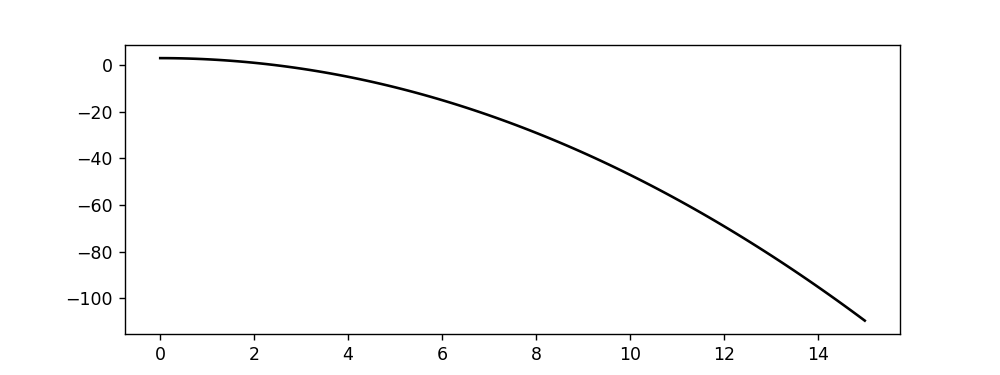

In [3]:
# for i in range(100):
#     a.step()
sol = solve_ivp(lambda t, y: -t, [0, 15], [3], t_eval = np.linspace(0,15, 100), rtol = 1e-5)
plt.plot(sol.t, sol.y[0], 'k')
plt.show()

In [4]:
def setAxis(major = 24):
    fig, ax = plt.subplots()
    # Major ticks every 20, minor ticks every 5
    major_ticks = np.arange(0, 1000, major)
    minor_ticks = np.arange(0, 1000, major/4)

    ax.set_xticks(major_ticks)
    ax.set_xticks(minor_ticks, minor=True)

    # And a corresponding grid
    ax.grid(which='both')

    # Or if you want different settings for the grids:
    ax.grid(which='minor', alpha=0.1)
    ax.grid(which='major', alpha=0.9)

In [5]:
import math
nu = 2*math.pi/22
gm = nu
dm = nu
gp = nu
dp = nu
r = 5
b = 10
V=0.5
pn0 = 500
K=(r/4-1)*pn0*V+1
a=dm*dp*pn0*((K+pn0/V)/K)**r/b #alpha

In [85]:
print(a)
print(K)

5374068.825693278
63.5


C:\Users\Yuelong Li\AppData\Roaming\Python\Python311\site-packages\scipy\integrate\_ivp\common.py:47: UserWarning: At least one element of `rtol` is too small. Setting `rtol = np.maximum(rtol, 2.220446049250313e-14)`.
  warn("At least one element of `rtol` is too small. "


<IPython.core.display.Javascript object>


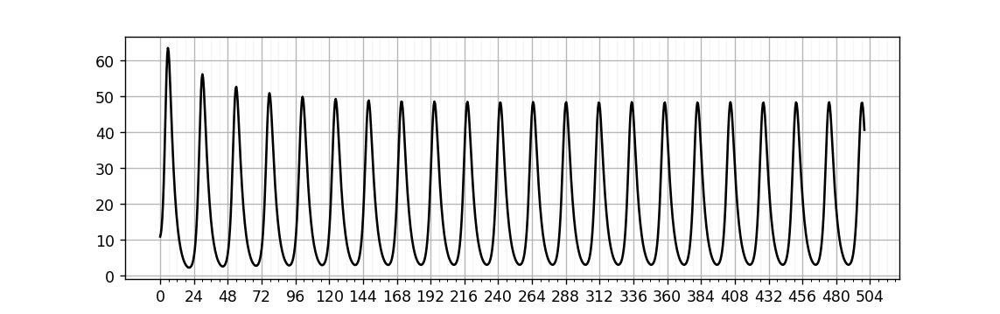

In [6]:
def func(t, y):
    mn= y[0]
    mc = y[1]
    pc = y[2]
    pn = y[3]
    dmn =  a*(K/(K+pn/V))**r-(gm)*mn
    dmc = gm*mn-dm*mc
    dpc= b*mc-gp*pc
    dpn = gp*pc-dp*pn
    return [dmn, dmc, dpc, dpn]

y0 = [10.9,1.88,pn0/2,pn0]
t1 = 500
sol0 = solve_ivp(func, [0, t1], y0, t_eval = np.linspace(0,t1, 1000), rtol = 1e-15)
# plt.plot(sol.t, sol.y[0], 'k')

fig, ax = plt.subplots()
# Major ticks every 20, minor ticks every 5
major_ticks = np.arange(0, 1000, 24)
minor_ticks = np.arange(0, 1000, 6)

ax.set_xticks(major_ticks)
ax.set_xticks(minor_ticks, minor=True)

# And a corresponding grid
ax.grid(which='both')

# Or if you want different settings for the grids:
ax.grid(which='minor', alpha=0.1)
ax.grid(which='major', alpha=0.9)
i0 = 0
plt.plot(sol0.t[i0:1000], sol0.y[0][i0:1000], 'k')
# plt.ylim(-50,100)
# plt.plot(sol.t[i0:], [(sol.y[0][i]-sol.y[0][i-1])/(sol.t[i]-sol.t[i-1]) for i in range(i0, len(sol.t))])
# plt.show()

### Standardized mode
sol0 is the standardized solution of the equilibrium state circadium clock after 250 seconds have elapsed, check for the start of a phase in sol0 by the minimum in mn, the nucleus mrna count.

In [7]:
# Construct a class to contain the standardized mode accessed by phase phi
class Standardized:
    def __init__(self, solution, startAt = 0):
        self.y = solution.y.transpose()
        phaseStart = 0
        for i in range(startAt, len(solution.t)-1):
            if(solution.y[0][i-1]>=solution.y[0][i] and 
                  solution.y[0][i]<=solution.y[0][i+1]):
                self.pstart = phaseStart = i;
                break;
        phaseEnd = phaseStart+1
        # Next minimum
        for i in range(phaseStart+1, len(solution.t)-1):
            if(solution.y[0][i-1]>=solution.y[0][i] and 
                  solution.y[0][i]<=solution.y[0][i+1]):
                self.pend = phaseEnd = i;
                break;
        self.tstart = solution.t[phaseStart]
        self.tend = solution.t[phaseEnd]
    def getPhase(self, phase):
        index = round(phase/2/math.pi*(self.pend-self.pstart))%(self.pstart-self.pend)+self.pstart
        return self.y[index]
    
    def getTime(self, t):
        return self.getPhase((t)/(self.tend-self.tstart)*2*math.pi)
    
standardized = Standardized(sol0, 700)

<IPython.core.display.Javascript object>


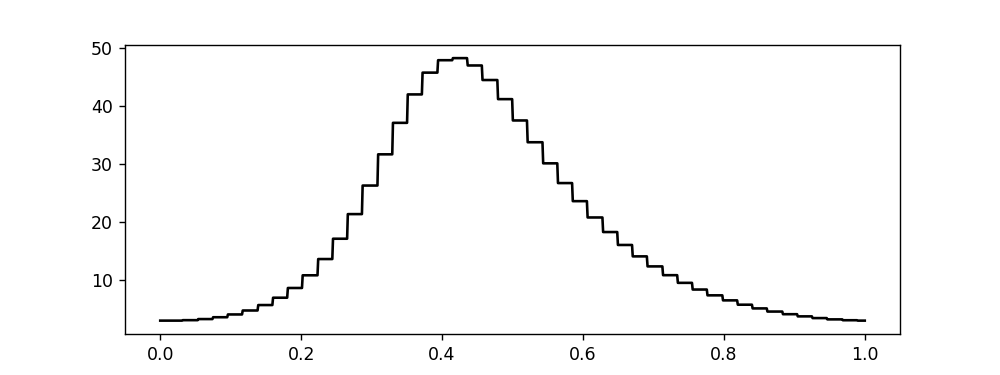

In [8]:
plt.plot(np.linspace(0,1,1000), [standardized.getPhase(i*2*math.pi)[0] for i in np.linspace(0,1,1000)], 'k')

In [34]:
72.3891-39.4593

32.9298

### Validation

<IPython.core.display.Javascript object>


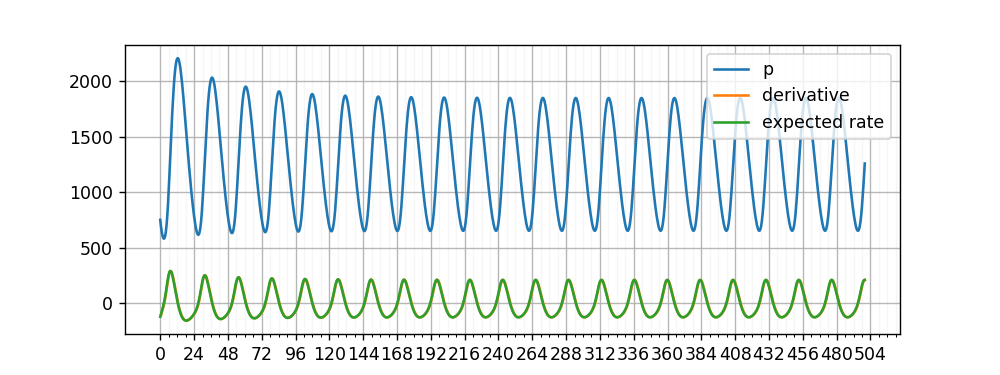

In [12]:
#Check total molecule of protein equal to its production rate minus degredation rate
totalP = sol0.y[2]+sol0.y[3]
setAxis()
plt.plot(sol0.t, totalP, label="p")
plt.plot(sol0.t[1:], np.diff(totalP)/np.diff(sol0.t), label="derivative")
totalPChange = b*sol0.y[1]-dp*sol0.y[3]
plt.plot(sol0.t, totalPChange, label="expected rate")
plt.legend()

<IPython.core.display.Javascript object>


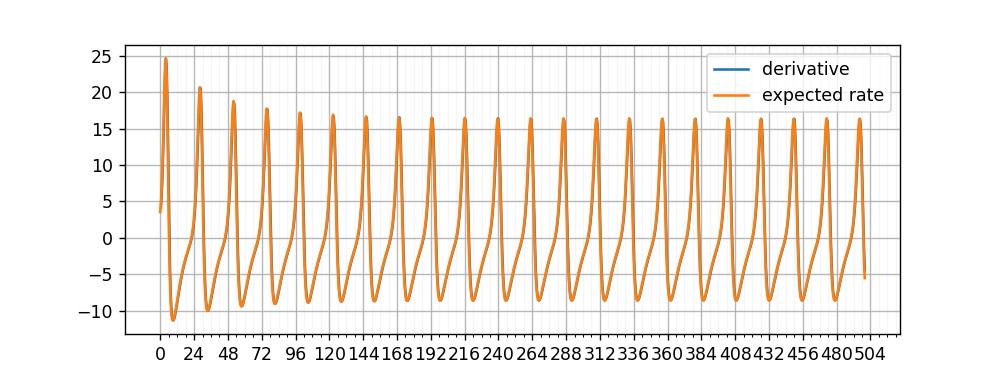

In [13]:
#Check total molecule of protein equal to its production rate minus degredation rate
totalM = sol0.y[0]+sol0.y[1]
setAxis()
# plt.plot(sol0.t, totalP, label="m")
plt.plot(sol0.t[1:], np.diff(totalM)/np.diff(sol0.t), label="derivative")
totalMChange =  a*(K/(K+sol0.y[3]/V))**r-gm*sol0.y[1]
plt.plot(sol0.t, totalMChange, label="expected rate")
plt.legend()

In [14]:
import random
nu = 2*math.pi/22
gm = nu
dm = nu
gp = nu
dp = nu
epm = 2/22
muc = dm+epm
mus = 1
r = 5
b = 10
V=0.1
pn0 = 500
K=(r/4-1)*pn0*V+1
a=dm*dp*pn0*((K+pn0/V)/K)**r/b #alpha

In [17]:
# Cell number
Nc = 6
# Correlated functionals
def funcs(t, ys):
    mn= ys[0:Nc]
    mc = ys[Nc:Nc*2]
    pc = ys[Nc*2:Nc*3]
    pn = ys[Nc*3:Nc*4]
    ms = ys[Nc*4]
    dmn =  [a*(K/(K+pn[i]/V))**r-gm*mn[i] for i in range(Nc)]
    dmc = [gm*mn[i]-muc*mc[i] + mus*ms for i in range(Nc)]
    dpc= [b*mc[i]-gp*pc[i] for i in range(Nc)]
    dpn = [gp*pc[i]-dp*pn[i] for i in range(Nc)]
    dms = muc*sum(mc)-Nc*ms*mus-dm*ms*Nc
    return dmn+dmc+dpc+dpn+[dms]

In [18]:
y0 = [10.9,1.88,pn0/2,pn0]*Nc+[0]
t1 = 500
sol = solve_ivp(funcs, [0, t1], y0, t_eval = np.linspace(0,t1, 1000), rtol = 1e-10)
# plt.plot(sol.t, sol.y[0], 'k')

<IPython.core.display.Javascript object>


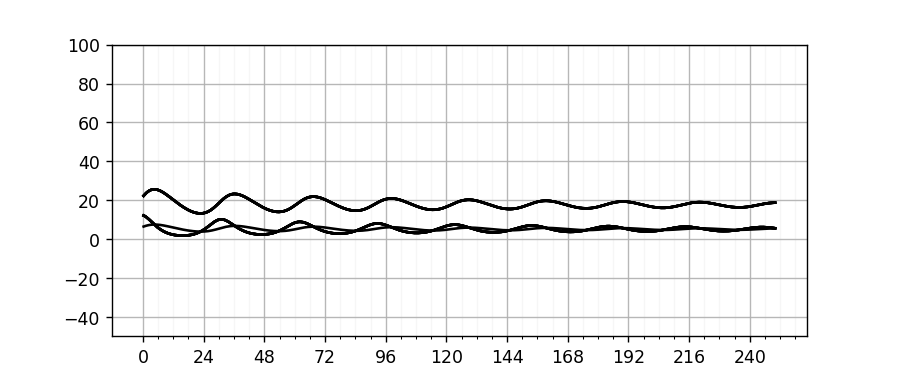

In [19]:

fig, ax = plt.subplots()
# Major ticks every 20, minor ticks every 5
major_ticks = np.arange(0, 1000, 24)
minor_ticks = np.arange(0, 1000, 6)

ax.set_xticks(major_ticks)
ax.set_xticks(minor_ticks, minor=True)

# And a corresponding grid
ax.grid(which='both')

# Or if you want different settings for the grids:
ax.grid(which='minor', alpha=0.1)
ax.grid(which='major', alpha=0.9)

i0 = 500
plt.plot(sol.t[i0:]-250, sol.y.transpose()[i0:], 'k')
plt.ylim(-50,100)
# plt.plot(sol.t[i0:], [(sol.y[0][i]-sol.y[0][i-1])/(sol.t[i]-sol.t[i-1]) for i in range(i0, len(sol.t))])
plt.show()

In [241]:
y0 = []
for n in range(Nc):
    y0 += [k*(1+0.5*random.random()) for k in [10.9,1.88,pn0/2,pn0]]
y0 += [0]
t1 = 500
sol = solve_ivp(funcs, [0, t1], y0, t_eval = np.linspace(0,t1, 1000), rtol = 1e-10)
# plt.plot(sol.t, sol.y[0], 'k')

<IPython.core.display.Javascript object>


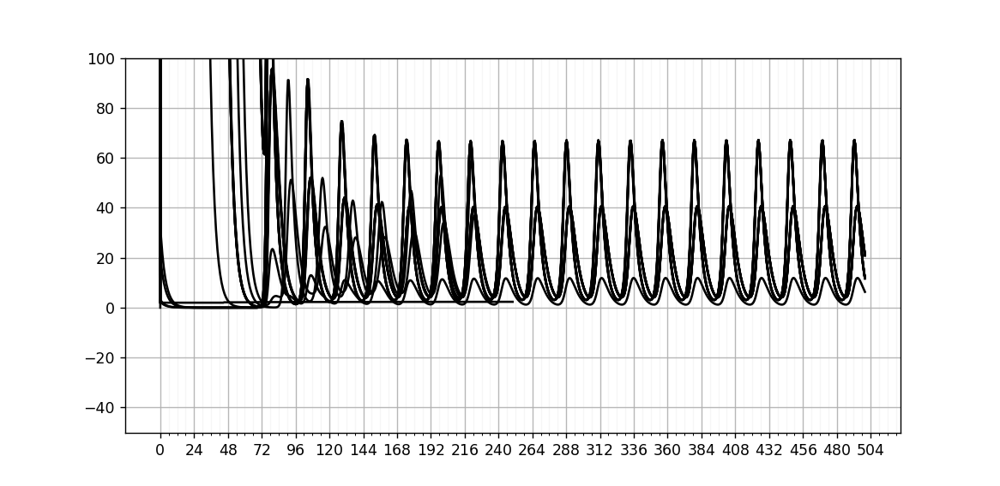

In [245]:
fig, ax = plt.subplots()
# Major ticks every 20, minor ticks every 5
major_ticks = np.arange(0, 1000, 24)
minor_ticks = np.arange(0, 1000, 6)

ax.set_xticks(major_ticks)
ax.set_xticks(minor_ticks, minor=True)

# And a corresponding grid
ax.grid(which='both')

# Or if you want different settings for the grids:
ax.grid(which='minor', alpha=0.1)
ax.grid(which='major', alpha=0.9)

i0 = 0
plt.plot(sol.t[i0:], sol.y.transpose()[i0:], 'k')
plt.ylim(-50,100)
# plt.plot(sol.t[i0:], [(sol.y[0][i]-sol.y[0][i-1])/(sol.t[i]-sol.t[i-1]) for i in range(i0, len(sol.t))])
plt.show()

### Intializing with desynchronized phases

In [410]:
# nu = 2*math.pi/22
# gm = nu
# dm = nu
# gp = nu
# dp = nu
# epm = 2/22
# muc = dm+epm
# mus = 1
# r = 5
# b = 10
# V=0.1
# pn0 = 500
# K=(r/4-1)*pn0*V+1
# a=dm*dp*pn0*((K+pn0/V)/K)**r/b #alpha

y0 = []
for n in range(Nc):
    ## Initialize at random phases
    y0 += standardized.getPhase(2*math.pi*random.random()).tolist()
y0 = np.array(y0).reshape(Nc,4).transpose(1,0).reshape(4*Nc).tolist()
y0 += [0]
sol = solve_ivp(funcs, [0, t1], y0, t_eval = np.linspace(0,t1, 1000), rtol = 1e-10)
# plt.plot(sol.t, sol.y[0], 'k')

<IPython.core.display.Javascript object>


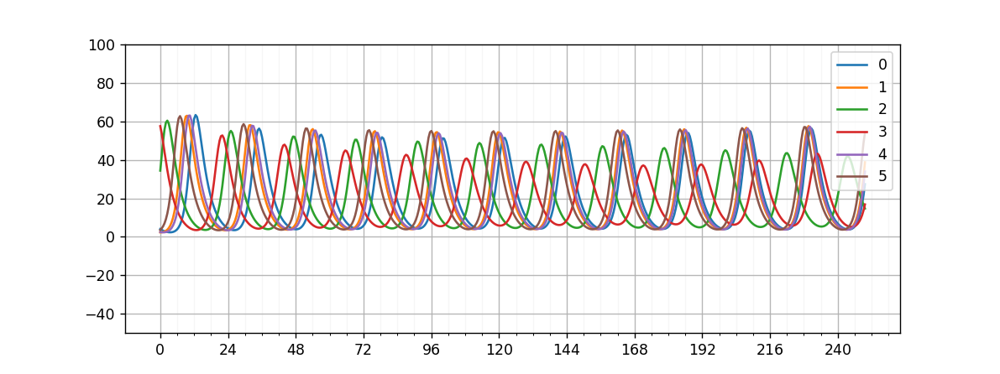

In [431]:
setAxis()

i0 = 0
cells = sol.y[:-1].reshape(4, Nc, -1).transpose(1, 0, 2) #sort by cell, then enzyme type, then time

#cells -> sort by enzyme type -> take mn -> sort by time -> each entry are cells
lines = plt.plot(sol.t[i0:500], cells.transpose(1,0,2)[0].transpose(1,0)[i0:500])
plt.legend(iter(lines), range(Nc), loc = 1)
# plt.plot(sol.t[i0:], sol.y[-1][i0:])

# plt.plot(sol.t[i0:], cells[0], 'k')

plt.ylim(-50,100)
# plt.plot(sol.t[i0:], [(sol.y[0][i]-sol.y[0][i-1])/(sol.t[i]-sol.t[i-1]) for i in range(i0, len(sol.t))])
# plt.legend()
plt.show()

<IPython.core.display.Javascript object>


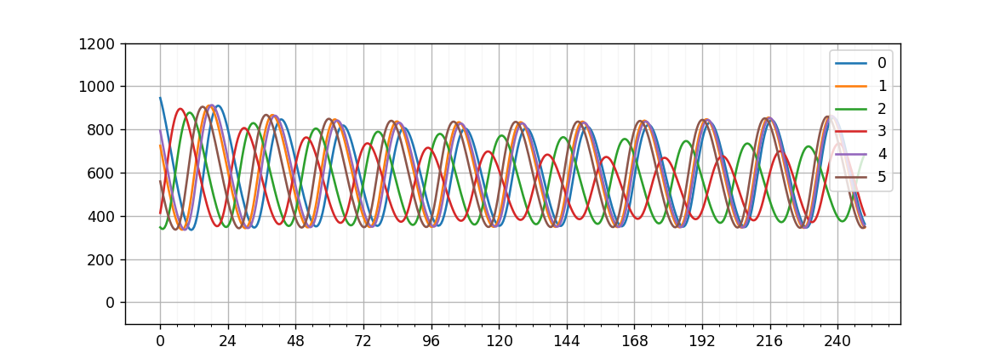

In [444]:
setAxis()
#cells -> sort by enzyme type -> take pn -> sort by time -> each entry are cellsplt.ylim(-50,100)
plt.ylim(-100,1200)
lines = plt.plot(sol.t[0:500], cells.transpose(1,0,2)[3].transpose(1,0)[0:500])
plt.legend(iter(lines), range(Nc), loc = 1)

### Synchronization after time evolution?

In [424]:
t1 = 1000
sol = solve_ivp(funcs, [0, t1], y0, t_eval = np.linspace(0,t1, 2000), rtol = 1e-10)
# plt.plot(sol.t, sol.y[0], 'k')

<IPython.core.display.Javascript object>


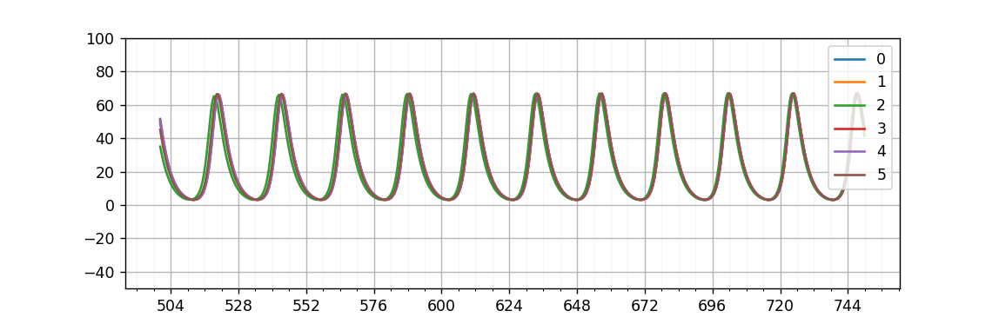

In [428]:
setAxis()

i0 = 1000 # start after 500 hours
cells = sol.y[:-1].reshape(4, Nc, -1).transpose(1, 0, 2) #sort by cell, then enzyme type, then time

#cells -> sort by enzyme type -> take mn -> sort by time -> each entry are cells
lines = plt.plot(sol.t[i0:1500], cells.transpose(1,0,2)[0].transpose(1,0)[i0:1500])
plt.legend(iter(lines), range(Nc), loc = 1)
plt.ylim(-50,100)

# plt.plot(sol.t[i0:], [(sol.y[0][i]-sol.y[0][i-1])/(sol.t[i]-sol.t[i-1]) for i in range(i0, len(sol.t))])
# plt.legend()
plt.show()

<IPython.core.display.Javascript object>


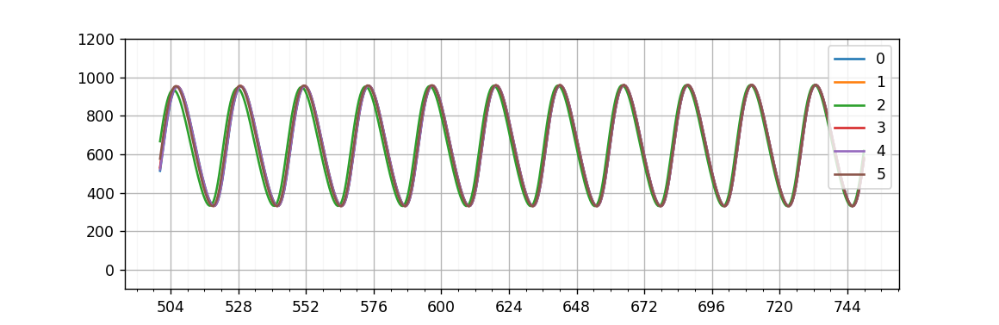

In [442]:
setAxis()
#cells -> sort by enzyme type -> take pn -> sort by time -> each entry are cellsplt.ylim(-50,100)
plt.ylim(-100,1200)
i0 = 1000
lines = plt.plot(sol.t[i0:1500], cells.transpose(1,0,2)[3].transpose(1,0)[i0:1500])
plt.legend(iter(lines), range(Nc), loc = 1)

Yes

What is happening to the blood mRnA concentration?

<IPython.core.display.Javascript object>


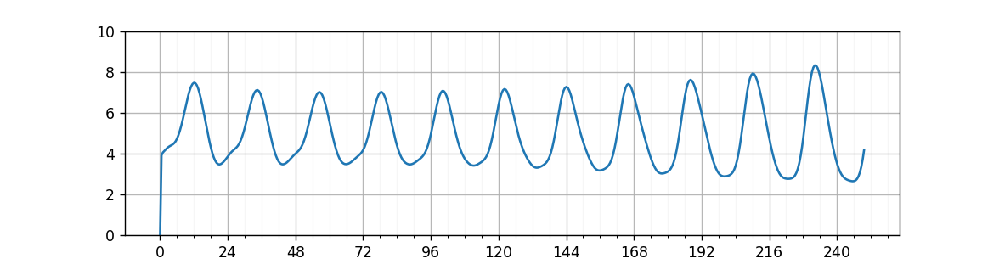

In [449]:
setAxis()
#cells -> sort by enzyme type -> take pn -> sort by time -> each entry are cellsplt.ylim(-50,100)
plt.ylim(0,10)
lines = plt.plot(sol.t[0:500], sol.y[-1][0:500])
# plt.legend(iter(lines), range(Nc), loc = 1)

<IPython.core.display.Javascript object>


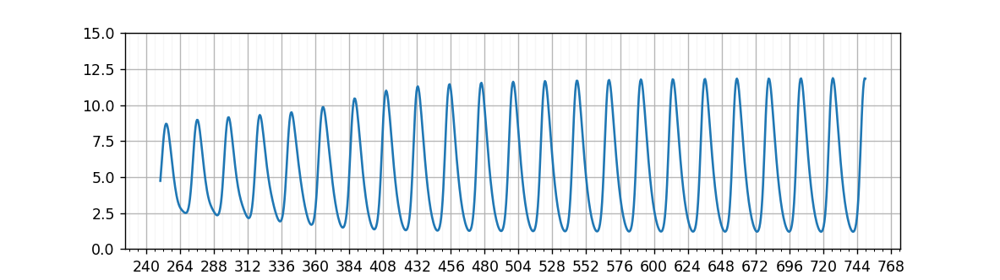

In [454]:
setAxis()
#cells -> sort by enzyme type -> take pn -> sort by time -> each entry are cellsplt.ylim(-50,100)
plt.ylim(0,15)
lines = plt.plot(sol.t[500:1500], sol.y[-1][500:1500])
# plt.legend(iter(lines), range(Nc), loc = 1)

In [470]:
p0 = [ 2*math.pi*random.random() for i in range(Nc)]

### Weaker $\mu_s$  

In [519]:
nu = 2*math.pi/22
gm = nu
dm = nu
gp = nu
dp = nu
epm = 2/22
muc = dm+epm
mus = epm
r = 5
b = 10
V=0.1
pn0 = 500
K=(r/4-1)*pn0*V+1
a=dm*dp*pn0*((K+pn0/V)/K)**r/b #alpha
Nc = 6

In [522]:
y0 = []
for n in range(Nc):
    ## Initialize at random phases
    y0 += standardized.getPhase(p0[n]).tolist()
y0 = np.array(y0).reshape(Nc,4).transpose(1,0).reshape(4*Nc).tolist()
y0 += [0]

t1 = 1000
sol = solve_ivp(funcs, [0, t1], y0, t_eval = np.linspace(0,t1, 1000), rtol = 1e-10)
cells = sol.y[:-1].reshape(4, Nc, -1).transpose(1, 0, 2) #sort by cell, then enzyme type, then time

<IPython.core.display.Javascript object>


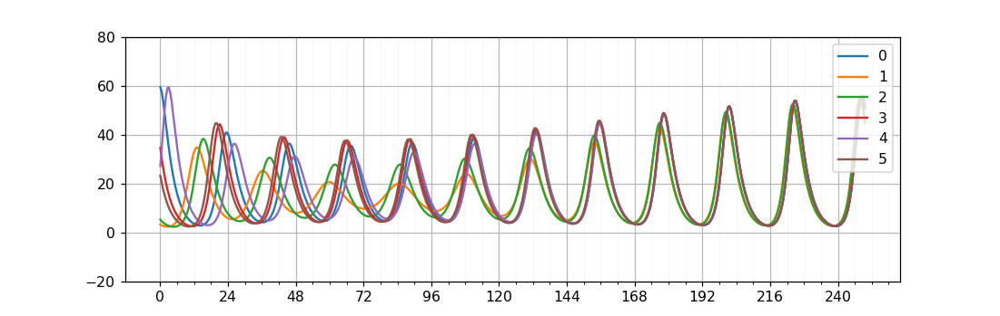

In [473]:
setAxis()

i0 = 0

#cells -> sort by enzyme type -> take mn -> sort by time -> each entry are cells
lines = plt.plot(sol.t[i0:500], cells.transpose(1,0,2)[0].transpose(1,0)[i0:500])
plt.legend(iter(lines), range(Nc), loc = 1)

plt.ylim(-20,80)
plt.show()

<IPython.core.display.Javascript object>


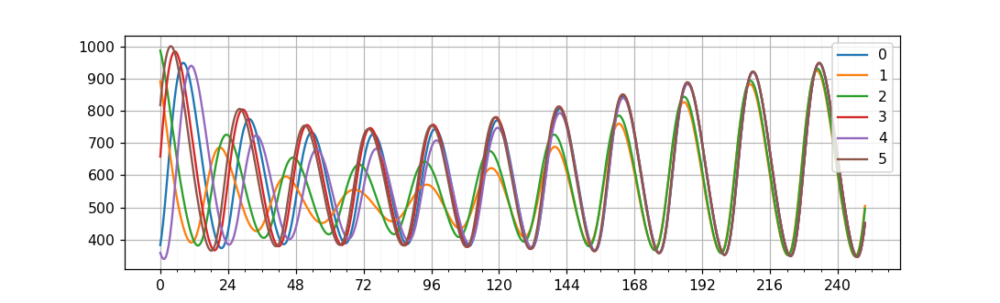

In [476]:
setAxis()

#cells -> sort by enzyme type -> take pn -> sort by time -> each entry are cells
lines = plt.plot(sol.t[i0:500], cells.transpose(1,0,2)[3].transpose(1,0)[i0:500])
plt.legend(iter(lines), range(Nc), loc = 1)

plt.show()

### Blood mRNA concentration

<IPython.core.display.Javascript object>


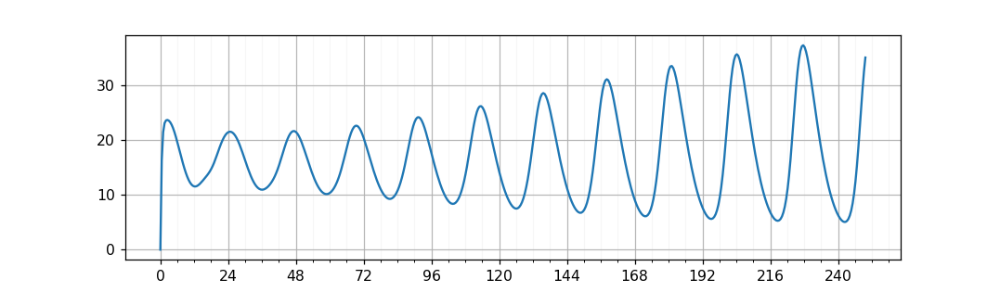

In [478]:
setAxis()
#cells -> sort by enzyme type -> take pn -> sort by time -> each entry are cellsplt.ylim(-50,100)
lines = plt.plot(sol.t[0:500], sol.y[-1][0:500])
# plt.legend(iter(lines), range(Nc), loc = 1)

### Large Nc = 1000

In [300]:
nu = 2*math.pi/22
gm = nu
dm = nu
gp = nu
dp = nu
epm = 1/11
muc = dm+epm
mus = epm
r = 5
b = 10
V=0.5
pn0 = 500
K=(r/4-1)*pn0*V+1
a=dm*dp*pn0*((K+pn0/V)/K)**r/b #alpha
# Cell number
Nc = 100

In [301]:
p1 = [ 2*math.pi*random.random() for i in range(Nc)]

In [302]:

t0 = 0
# Correlated functionals
def funcs(t, ys):
#     # For progress tracking
#     last_t, dt = state
    
#     # let's subdivide t_span into 1000 parts
#     # call update(n) here where n = (t - last_t) / dt
#     time.sleep(0.1)
#     n = int((t - last_t)/dt)
#     pbar.update(n)
    
#     # we need this to take into account that n is a rounded number.
#     state[0] = last_t + dt * n
    
    mn= ys[0:Nc]
    mc = ys[Nc:Nc*2]
    pc = ys[Nc*2:Nc*3]
    pn = ys[Nc*3:Nc*4]
    ms = ys[Nc*4]
    dmn =  [a*(K/(K+pn[i]/V))**r-gm*mn[i] for i in range(Nc)]
    dmc = [gm*mn[i]-muc*mc[i] + mus*ms for i in range(Nc)]
    dpc= [b*mc[i]-gp*pc[i] for i in range(Nc)]
    dpn = [gp*pc[i]-dp*pn[i] for i in range(Nc)]
    dms = muc*sum(mc)-Nc*ms*mus-dm*ms*Nc
    return dmn+dmc+dpc+dpn+[dms]

In [303]:
import time
from tqdm import tqdm

In [304]:
y0 = []
for n in range(Nc):
    ## Initialize at random phases
    y0 += standardized.getPhase(p1[n]).tolist()
y0 = np.array(y0).reshape(Nc,4).transpose(1,0).reshape(4*Nc).tolist()
y0 += [0]

t1 = 1000
# with tqdm(total=1000, unit="‰") as pbar:
#     sol = solve_ivp(
#         funcs,
#         [0, t1],
#         y0,
#         t_eval=np.linspace(0,t1, 2000),
#         args=[pbar, [t0, (t1-t0)/1000]],
#         rtol = 1e-5
#     )
SOL100 = solve_ivp(funcs, [0, t1], y0, t_eval = np.linspace(0,t1, 1000), rtol = 1e-15)

c:\python3\lib\site-packages\scipy\integrate\_ivp\common.py:46: UserWarning: `rtol` is too low, setting to 2.220446049250313e-14
  warn("`rtol` is too low, setting to {}".format(100 * EPS))


In [305]:

cells = SOL100.y[:-1].reshape(4, Nc, -1).transpose(1, 0, 2) #sort by cell, then enzyme type, then time
# SOL1000 = sol

<IPython.core.display.Javascript object>


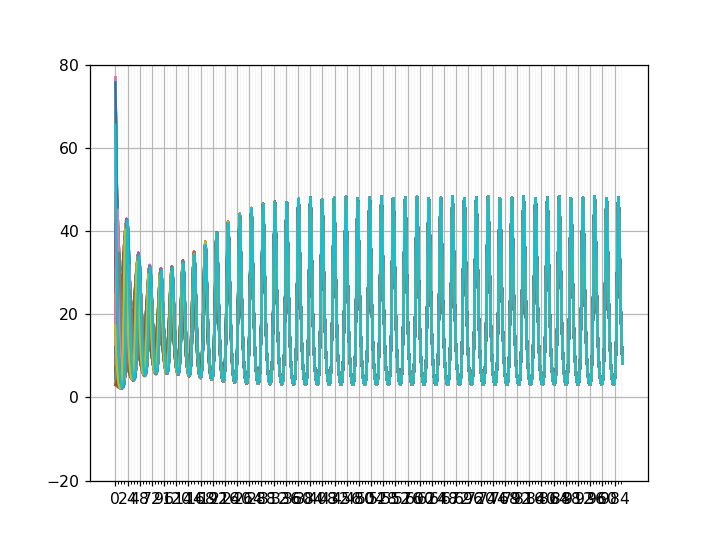

In [306]:
setAxis(24)

i0 = 0

#cells -> sort by enzyme type -> take mn -> sort by time -> each entry are cells
lines = plt.plot(SOL100.t[i0:1000], cells.transpose(1,0,2)[0].transpose(1,0)[i0:1000])
# plt.legend(iter(lines), range(Nc), loc = 1)

plt.ylim(-20,80)
plt.show()

<IPython.core.display.Javascript object>


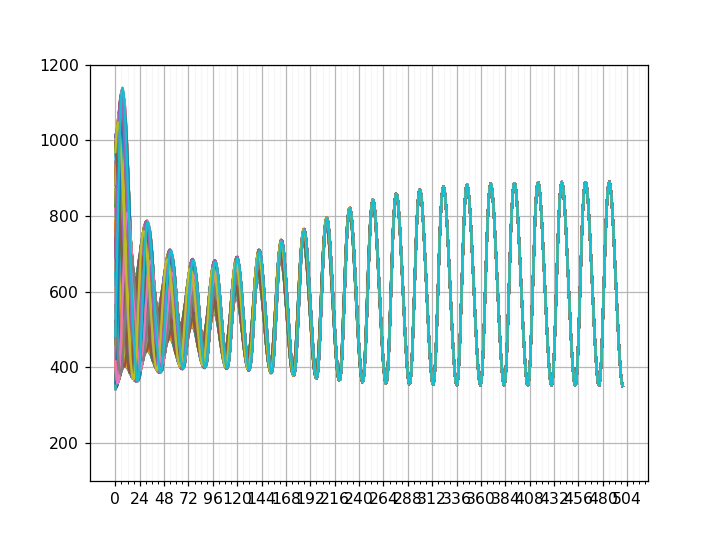

In [307]:
setAxis(24)

i0 = 0

#cells -> sort by enzyme type -> take pn -> sort by time -> each entry are cells
lines = plt.plot(SOL100.t[i0:500], cells.transpose(1,0,2)[3].transpose(1,0)[i0:500])
# plt.legend(iter(lines), range(Nc), loc = 1)

plt.ylim(100,1200)
plt.show()

In [ ]:
setAxis(24)

i0 = 0

#cells -> sort by enzyme type -> take pc -> sort by time -> each entry are cells
lines = plt.plot(sol.t[i0:500], cells.transpose(1,0,2)[2].transpose(1,0)[i0:500])
# plt.legend(iter(lines), range(Nc), loc = 1)

plt.ylim(100,1300)
plt.show()

In [ ]:
setAxis(24)

i0 = 0

#cells -> sort by enzyme type -> take mc -> sort by time -> each entry are cells
lines = plt.plot(sol.t[i0:500], cells.transpose(1,0,2)[1].transpose(1,0)[i0:500])
# plt.legend(iter(lines), range(Nc), loc = 1)
plt.ylim(-10,60)
plt.show()

In [ ]:
setAxis(24)

i0 = 0

#cells -> sort by enzyme type -> take pn -> sort by time -> each entry are cells
lines = plt.plot(sol.t[i0:500], SOL100.y[-1][i0:500])
# plt.legend(iter(lines), range(Nc), loc = 1)
plt.ylim(-10,60)
plt.show()

In [ ]:
setAxis(24)

i0 = 0

#cells -> sort by enzyme type -> take pn -> sort by time -> each entry are cells
lines = plt.plot(sol.t[i0:500], cells.transpose(1,0,2)[1].transpose(1,0)[i0:500])
plt.plot(sol.t[i0:500], SOL100.y[-1][i0:500], label = "blood mRNA concentration")
# plt.legend(iter(lines), range(Nc), loc = 1)
plt.legend()
plt.ylim(-10,60)
plt.show()

In [177]:
### Large Nc = 1000
nu = 2*math.pi/22
gm = nu
dm = nu
gp = nu
dp = nu
epm = 2/22
muc = dm+epm
mus = epm
r = 5
b = 10
V=0.5
pn0 = 500

K=(r/4-1)*pn0*V+1
a=dm*dp*pn0*((K+pn0/V)/K)**r/b #alpha
# Cell number
Nc = 150

p1 = [ 2*math.pi*random.random() for i in range(Nc)]

In [20]:
# print(p1)
p1=[2.0550325576312103, 4.359297897118835, 0.39127429679029313, 2.124259150141422, 5.479455204425693, 4.4522722050873265, 3.5594566055272505, 5.907126664719819, 1.9299719286357633, 3.653451514146063, 3.756909134046489, 0.06709425606412503, 2.508395530063223, 5.871418816609598, 0.2554347895451874, 5.814912807452971, 1.6238364735200475, 0.4931468396565987, 5.434458630114997, 4.673023094656499, 4.175510607028528, 5.331725334610489, 2.429549855683887, 2.401829579562871, 1.3779985836992545, 4.338440773003609, 3.4169539689282864, 2.3893272522662734, 2.883233267163166, 1.445097791060265, 3.170210720586834, 6.05328348473917, 5.412656062775904, 0.4482058638410899, 3.2768437733635247, 0.703392193790646, 0.9147517752833452, 5.652757151892038, 4.134180254198798, 2.599796487790763, 0.2641737840317318, 4.29265552519482, 0.7574188004939325, 4.024303297462376, 4.061056902656161, 5.74073362556236, 4.072947506942446, 2.53427394852962, 2.448114669536506, 0.4410046906883344, 5.9122176068657835, 4.900566118937582, 4.995272109084479, 5.944830910997268, 2.683904700319358, 4.384035592228705, 3.4039575771931587, 2.160594379240466, 5.838277854090754, 1.8207452608979022, 0.7527181947322295, 3.989361649777552, 3.4864647234117867, 2.995407791155678, 4.290162820869329, 2.085484903555902, 5.513130030148102, 0.8272658240977901, 0.0939332924576044, 2.758203141621589, 2.951304723337934, 4.613730211663004, 1.437213770739818, 2.8718864241851465, 3.0731078591321137, 2.1520832181865432, 0.5680929566453192, 5.731724344703969, 0.4855533857167901, 2.5252285813962767, 3.03500419502513, 6.188100377041044, 3.5820736510809272, 5.936193293119712, 6.1114288847081, 3.60086211218339, 3.973913637294208, 4.068832678458744, 5.477201939512491, 4.813230501852878, 2.311223419676567, 2.582363973613781, 2.5079983094663842, 1.6121433494825557, 2.0021772751246956, 2.639066351759859, 2.651361221424985, 5.761281870098869, 0.8660510434597255, 1.7019453639625162, 1.4455275170629251, 4.100018364322525, 3.4616852638160402, 0.5219941740721621, 2.641700497346548, 0.4492648501452989, 3.6534815663841593, 2.612636714304531, 1.071716811908424, 0.8853535406289, 0.8004083407782995, 3.698899699614754, 0.15060496285111713, 4.294018247051625, 2.537803775269444, 6.244770079993182, 5.317940193245052, 3.439314970456838, 2.3462078593860083, 2.3340949579077805, 5.648394900969982, 3.333996798408513, 0.2845353020358603, 2.7646510210125985, 0.10860676844497964, 2.968902360890147, 2.4858662156056015, 0.7052270787427076, 0.11976831166605773, 3.140954734193011, 4.735103058232551, 5.022975745730478, 4.614063507785606, 3.3431812796794484, 1.2638124952935086, 2.345501753139302, 2.452667459205615, 2.6302924040454876, 1.690467202260211, 3.0946918697563226, 2.100467951892224, 4.680634897267893, 1.4798413014238203, 1.7983015676426097, 5.691092593417551, 6.092745834964644, 3.3152630674970864, 4.0162129886659335, 3.562595737062359, 4.425966062250925]

In [179]:

t0 = 0
# Correlated functionals
def funcs(t, ys):
#     # For progress tracking
#     last_t, dt = state
    
#     # let's subdivide t_span into 1000 parts
#     # call update(n) here where n = (t - last_t) / dt
#     time.sleep(0.1)
#     n = int((t - last_t)/dt)
#     pbar.update(n)
    
#     # we need this to take into account that n is a rounded number.
#     state[0] = last_t + dt * n
    
    mn= ys[0:Nc]
    mc = ys[Nc:Nc*2]
    pc = ys[Nc*2:Nc*3]
    pn = ys[Nc*3:Nc*4]
    ms = ys[Nc*4]
    dmn =  [a*(K/(K+pn[i]/V))**r-gm*mn[i] for i in range(Nc)]
    dmc = [gm*mn[i]-muc*mc[i] + mus*ms for i in range(Nc)]
    dpc= [b*mc[i]-gp*pc[i] for i in range(Nc)]
    dpn = [gp*pc[i]-dp*pn[i] for i in range(Nc)]
    dms = muc*sum(mc)-Nc*ms*mus-dm*ms*Nc
    return dmn+dmc+dpc+dpn+[dms]


In [180]:

y0 = []
for n in range(Nc):
    ## Initialize at random phases
    y0 += standardized.getPhase(p1[n]).tolist()
y0 = np.array(y0).reshape(Nc,4).transpose(1,0).reshape(4*Nc).tolist()
y0 += [0]

t1 = 2000
# with tqdm(total=1000, unit="‰") as pbar:
#     sol = solve_ivp(
#         funcs,
#         [0, t1],
#         y0,
#         t_eval=np.linspace(0,t1, 2000),
#         args=[pbar, [t0, (t1-t0)/1000]],
#         rtol = 1e-5
#     )
SOL100SmallDiff = solve_ivp(funcs, [0, t1], y0, t_eval = np.linspace(0,t1, 2000), rtol = 1e-15)

In [181]:

cells = SOL100SmallDiff.y[:-1].reshape(4, Nc, -1).transpose(1, 0, 2) #sort by cell, then enzyme type, then time
# SOL1000 = sol

<IPython.core.display.Javascript object>


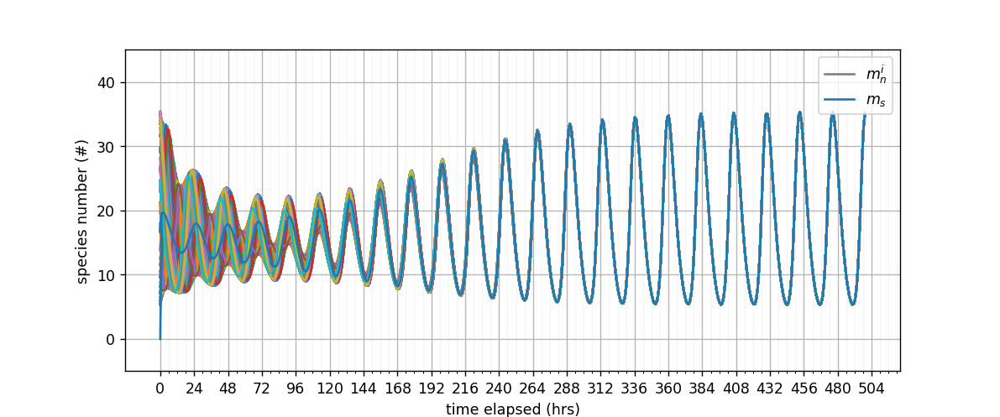

In [233]:
setAxis(24)

i0 = 0
i1 = 500

#cells -> sort by enzyme type -> take mc -> sort by time -> each entry are cells
lines = plt.plot(SOL100SmallDiff.t[i0:i1], cells.transpose(1,0,2)[1].transpose(1,0)[i0:i1])
line2 = plt.plot(SOL100SmallDiff.t[i0:i1], SOL100SmallDiff.y[-1][i0:i1], label = "blood mRNA concentration")
plt.xlabel("time elapsed (hrs)")
plt.ylabel("species number (#)")
# plt.legend(iter(lines), range(Nc), loc = 1)
plt.legend(iter([lines[7],line2[0]]), ("$m_n^i$","$m_s$"), loc=1)
plt.ylim(-5,45)
plt.show()

<IPython.core.display.Javascript object>


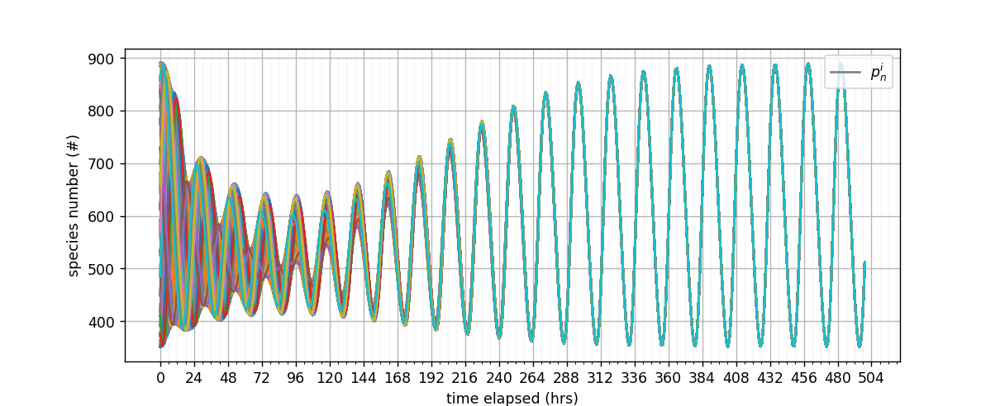

In [238]:
setAxis(24)

i0 = 0
i1 = 500

#cells -> sort by enzyme type -> take pn -> sort by time -> each entry are cells
lines = plt.plot(SOL100SmallDiff.t[i0:i1], cells.transpose(1,0,2)[3].transpose(1,0)[i0:i1])
# plt.legend(iter(lines), range(Nc), loc = 1)g
plt.legend([lines[7]],["$p_n^i$"], loc=1)
plt.xlabel("time elapsed (hrs)")
plt.ylabel("species number (#)")
# plt.ylim(200,1400)
plt.show()

### Mean-field approximation

What is the mean concentration of $p_n$

<IPython.core.display.Javascript object>


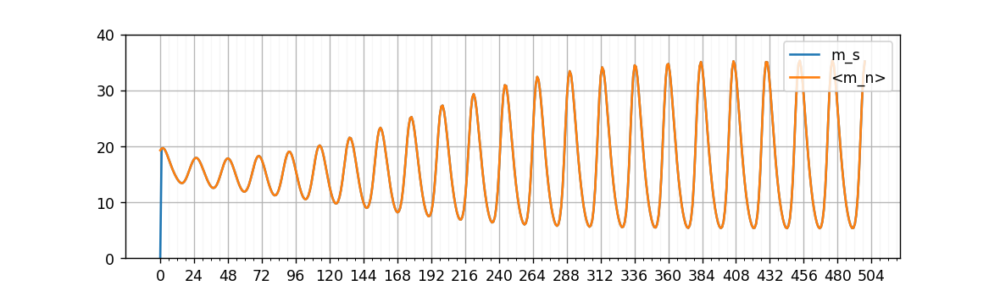

In [184]:
setAxis()
#cells -> sort by enzyme type -> take pn -> sort by time -> each entry are cells
plt.plot(SOL100SmallDiff.t[i0:i1], SOL100SmallDiff.y[Nc*4][i0:i1], label="m_s")
lines = plt.plot(SOL100SmallDiff.t[i0:i1], np.sum(cells.transpose(1,0,2)[1].transpose(1,0),1)[i0:i1]/Nc, label="<m_n>")
# plt.legend(iter(lines), range(Nc), loc = 1)g
plt.legend(loc = 1)
plt.ylim(0,40)
plt.show()

<IPython.core.display.Javascript object>


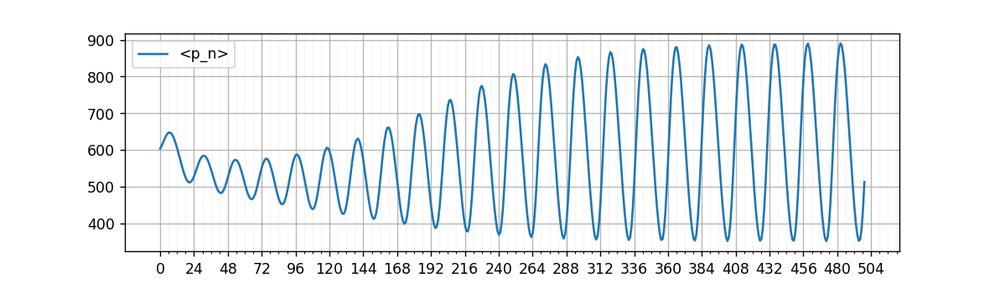

In [185]:
setAxis()
lines = plt.plot(SOL100SmallDiff.t[i0:i1], np.sum(cells.transpose(1,0,2)[3].transpose(1,0),1)[i0:i1]/Nc, label="<p_n>")
plt.legend()
plt.show()

Distribution of $p_n - \tilde{p_n}$ 

<IPython.core.display.Javascript object>


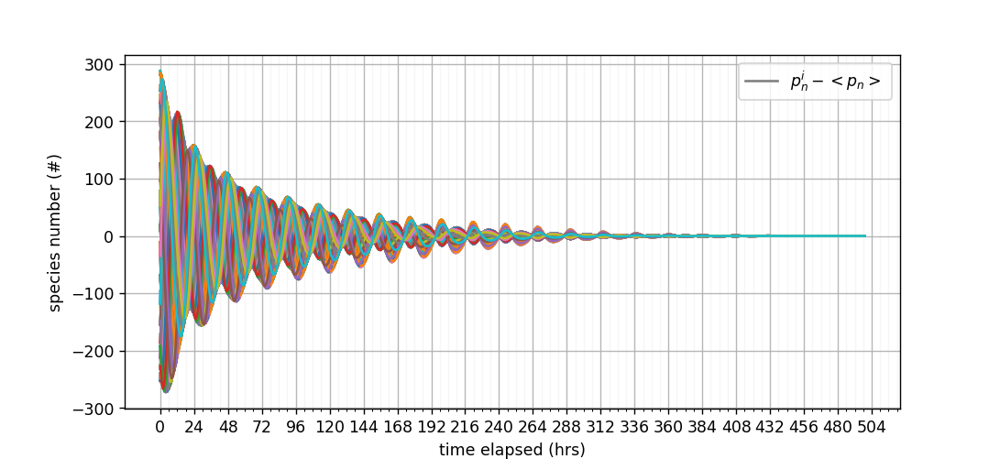

In [236]:
setAxis()
diff = cells.transpose(1,0,2)[3].transpose(1,0)-np.expand_dims(np.sum(cells.transpose(1,0,2)[3].transpose(1,0),1),1)/Nc
#cells -> sort by enzyme type -> take pn -> sort by time -> each entry are cells
i0 = 0
i1 = 500
lines = plt.plot(SOL100SmallDiff.t[i0:i1], diff[i0:i1], label="$p_n^i-<p_n>$ ")
# plt.legend(iter(lines), range(Nc), loc = 1)g
plt.legend(lines[7:8],["$p_n^i-<p_n>$ "])
plt.xlabel("time elapsed (hrs)")
plt.ylabel("species number (#)")
# plt.ylim(-700,800)
plt.show()

<IPython.core.display.Javascript object>


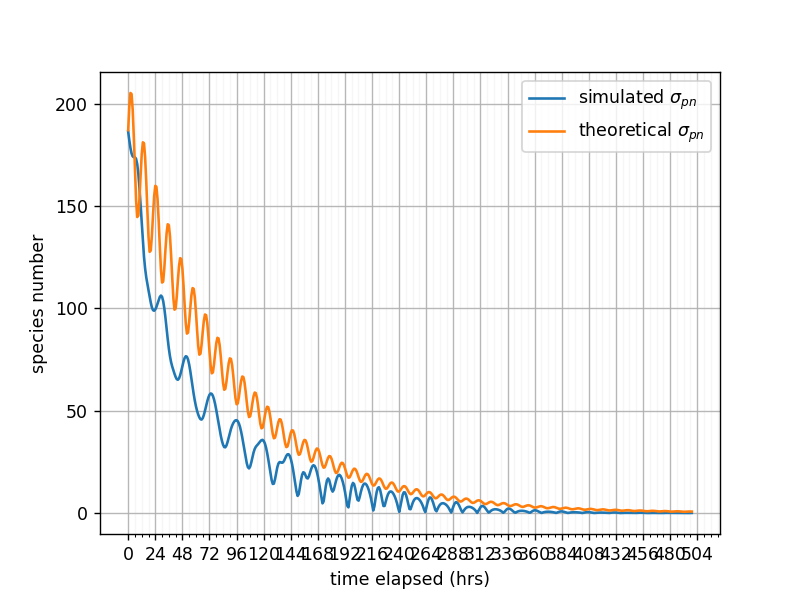

In [257]:
setAxis()
i0=0
i1=500
sigms = [np.std(diff[i]) for i in range(i0, i1)]
plt.plot(SOL100SmallDiff.t[i0:i1], sigms, label="simulated $\sigma_{pn}$")
t = SOL100SmallDiff.t[i0:i1]
plt.plot(t,np.sqrt(np.abs(35000+10000*np.sin(2*nu*t)))*(np.exp(-t*epm*0.125)), label="theoretical $\sigma_{pn}$")
plt.xlabel("time elapsed (hrs)")
plt.ylabel("species number")
l=plt.legend()
# plt.plot(t,100*((t*epm/8)*np.exp(-t*epm/4)))
# plt.plot(t, sigms-200*(np.exp(-t*epm*0.25)))
# plt.plot(t,100*((t*epm*0.25)**2*np.exp(-t*epm*0.25)-(t*epm*0.25)*np.exp(-t*epm*0.25)) )
# plt.plot(t,100*((t*epm/8)*np.exp(-t*epm/4)) +200*(np.exp(-t*epm*0.25)))

### Another Example

In [51]:
### Large Nc = 1000
nu = 2*math.pi/24
gm = nu
dm = nu
gp = nu
dp = nu
epm = 3/22
muc = dm+epm
mus = epm
r = 5
b = 9
V=0.5
pn0 = 500

K=(r/4-1)*pn0*V+1
a=dm*dp*pn0*((K+pn0/V)/K)**r/b #alpha
# Cell number
Nc = 150

p1 = [ 2*math.pi*random.random() for i in range(Nc)]

In [52]:
# print(p1)
p1 = [4.804969855796695, 1.0294329700912948, 2.012964618955888, 3.412189796684, 2.15559270575496, 1.2604999155947916, 1.6975359113343453, 1.9216115194883707, 4.061136100561378, 4.39432318701998, 5.523757797946249, 0.5335689821569956, 1.4016535812660407, 2.0064731718782522, 5.9382320778310484, 4.923541749615879, 6.057429758879983, 5.5597943805706596, 4.560498096239658, 1.9284779028417003, 1.8461555216376282, 4.423534511526533, 4.785055865886136, 3.791492764637156, 3.1723902575529115, 6.212545914699373, 0.5108252727032121, 3.1855028814736, 2.9108317856195374, 1.478952368515612, 4.257857628563645, 5.510418479416443, 0.9318393435500184, 3.7461863926007823, 5.544643970272602, 5.847251315873583, 5.244497909237006, 3.406848315363366, 5.618556032945834, 0.3805799635020331, 1.140603141740864, 4.514299700188368, 6.1152492531823635, 4.664730122922039, 0.5593459677821148, 1.8118324214447346, 1.5887489092846574, 5.157913848624147, 1.0015514545490214, 6.274704851694044, 2.201435078693987, 2.299323689323535, 4.707809489423218, 0.4392074170886628, 1.0289684490835833, 2.543637308847669, 2.7864544502121706, 2.1000203881371258, 6.17245398739366, 1.2970161851335145, 6.05535200704325, 1.6551468217838625, 4.350055593365616, 2.8453472434632014, 1.6735032188264565, 4.202705094342952, 3.985671950341843, 4.031500883779604, 6.072747376882493, 5.844045773301401, 1.7027114002900336, 3.70124294861443, 4.431001376825051, 5.683124484568048, 3.370843741030144, 4.823797618482998, 3.8183675013060023, 4.747710307833231, 3.1681319921725315, 2.733753732007416, 5.175763842050779, 0.015469612078822949, 1.7118844390420815, 1.4759092258731197, 2.5358561488325195, 1.6653502382256626, 3.3273149225018295, 3.8754282040230983, 1.1312909122076251, 0.03446693747660195, 0.5066876712042301, 5.4545404377390785, 2.5034790157433657, 2.3270312647963887, 4.299235872920485, 5.488494761522118, 2.587775428150125, 2.978568977753655, 3.593386040808667, 0.33369500778889566, 2.958001521800068, 4.584788993244197, 1.1506960616839008, 2.1492108191189083, 3.9816311598183196, 1.090935411650931, 2.189223000520201, 5.919996464027195, 2.949477657237806, 6.255074896065636, 2.045467733828905, 5.351562980759273, 0.9916659913952691, 5.897290104111269, 4.5522158656244525, 3.5090469952570356, 5.363011439969218, 1.4374218005034674, 2.533900091803923, 5.4404069274246405, 0.2178654767811202, 5.604208202447362, 3.4290489045846306, 2.310351573733266, 4.155423831028272, 3.310530610414571, 2.868272974325894, 0.5428996466694541, 1.818864753666667, 2.9334794990402195, 3.7164632396588226, 1.721328377219496, 3.2706593292531543, 6.274054286634836, 3.7443828642524504, 2.6906075836955257, 0.05938919794638378, 1.1734829534720834, 0.9147399049843356, 3.11420947115426, 4.325830561488094, 3.9836345478693915, 4.996248693270793, 1.4010556897549165, 0.3784450062088365, 3.9361081447846007, 5.135761131020027, 2.82499468597243, 5.035381840310782, 1.4229861605440035]

In [53]:

t0 = 0
# Correlated functionals
def funcs(t, ys):
#     # For progress tracking
#     last_t, dt = state
    
#     # let's subdivide t_span into 1000 parts
#     # call update(n) here where n = (t - last_t) / dt
#     time.sleep(0.1)
#     n = int((t - last_t)/dt)
#     pbar.update(n)
    
#     # we need this to take into account that n is a rounded number.
#     state[0] = last_t + dt * n
    
    mn= ys[0:Nc]
    mc = ys[Nc:Nc*2]
    pc = ys[Nc*2:Nc*3]
    pn = ys[Nc*3:Nc*4]
    ms = ys[Nc*4]
    dmn =  [a*(K/(K+pn[i]/V))**r-gm*mn[i] for i in range(Nc)]
    dmc = [gm*mn[i]-muc*mc[i] + mus*ms for i in range(Nc)]
    dpc= [b*mc[i]-gp*pc[i] for i in range(Nc)]
    dpn = [gp*pc[i]-dp*pn[i] for i in range(Nc)]
    dms = muc*sum(mc)-Nc*ms*mus-dm*ms*Nc
    return dmn+dmc+dpc+dpn+[dms]


In [54]:

y0 = []
for n in range(Nc):
    ## Initialize at random phases
    y0 += standardized.getPhase(p1[n]).tolist()
y0 = np.array(y0).reshape(Nc,4).transpose(1,0).reshape(4*Nc).tolist()
y0 += [0]

t1 = 2000
# with tqdm(total=1000, unit="‰") as pbar:
#     sol = solve_ivp(
#         funcs,
#         [0, t1],
#         y0,
#         t_eval=np.linspace(0,t1, 2000),
#         args=[pbar, [t0, (t1-t0)/1000]],
#         rtol = 1e-5
#     )
SOL100SmallDiff = solve_ivp(funcs, [0, t1], y0, t_eval = np.linspace(0,t1, 2000), rtol = 1e-15)

In [55]:

cells = SOL100SmallDiff.y[:-1].reshape(4, Nc, -1).transpose(1, 0, 2) #sort by cell, then enzyme type, then time
# SOL1000 = sol

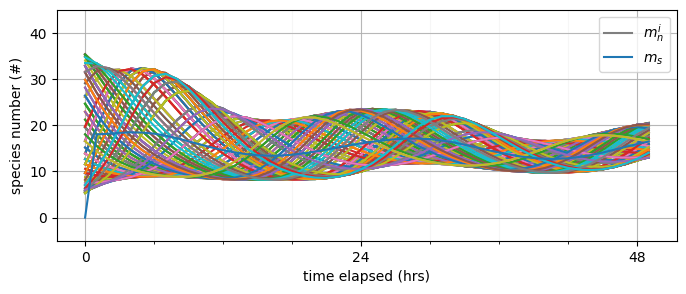

In [56]:
setAxis(24)

i0 = 0
i1 = 50

#cells -> sort by enzyme type -> take mc -> sort by time -> each entry are cells
lines = plt.plot(SOL100SmallDiff.t[i0:i1], cells.transpose(1,0,2)[1].transpose(1,0)[i0:i1])
line2 = plt.plot(SOL100SmallDiff.t[i0:i1], SOL100SmallDiff.y[-1][i0:i1], label = "blood mRNA concentration")
plt.xlabel("time elapsed (hrs)")
plt.ylabel("species number (#)")
# plt.legend(iter(lines), range(Nc), loc = 1)
plt.legend(iter([lines[7],line2[0]]), ("$m_n^i$","$m_s$"), loc=1)
plt.ylim(-5,45)
plt.show()

<IPython.core.display.Javascript object>


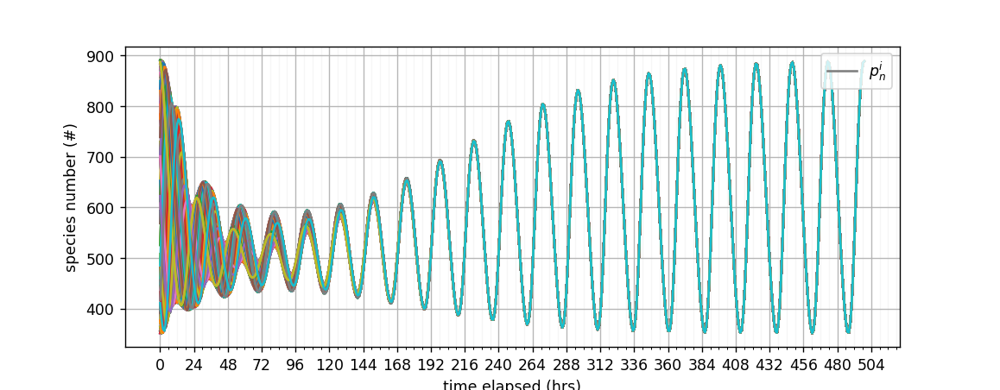

In [75]:
setAxis(24)

i0 = 0
i1 = 500

#cells -> sort by enzyme type -> take pn -> sort by time -> each entry are cells
lines = plt.plot(SOL100SmallDiff.t[i0:i1], cells.transpose(1,0,2)[3].transpose(1,0)[i0:i1])
# plt.legend(iter(lines), range(Nc), loc = 1)g
plt.legend([lines[7]],["$p_n^i$"], loc=1)
plt.xlabel("time elapsed (hrs)")
plt.ylabel("species number (#)")
# plt.ylim(200,1400)
plt.show()

#### Mean field approximation

<IPython.core.display.Javascript object>


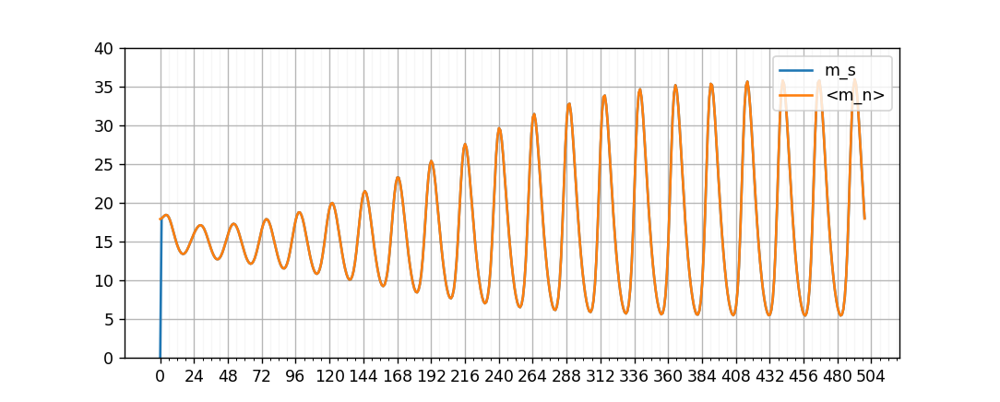

In [29]:
setAxis()
#cells -> sort by enzyme type -> take pn -> sort by time -> each entry are cells
plt.plot(SOL100SmallDiff.t[i0:i1], SOL100SmallDiff.y[Nc*4][i0:i1], label="m_s")
lines = plt.plot(SOL100SmallDiff.t[i0:i1], np.sum(cells.transpose(1,0,2)[1].transpose(1,0),1)[i0:i1]/Nc, label="<m_n>")
# plt.legend(iter(lines), range(Nc), loc = 1)g
plt.legend(loc = 1)
plt.ylim(0,40)
plt.show()

<IPython.core.display.Javascript object>


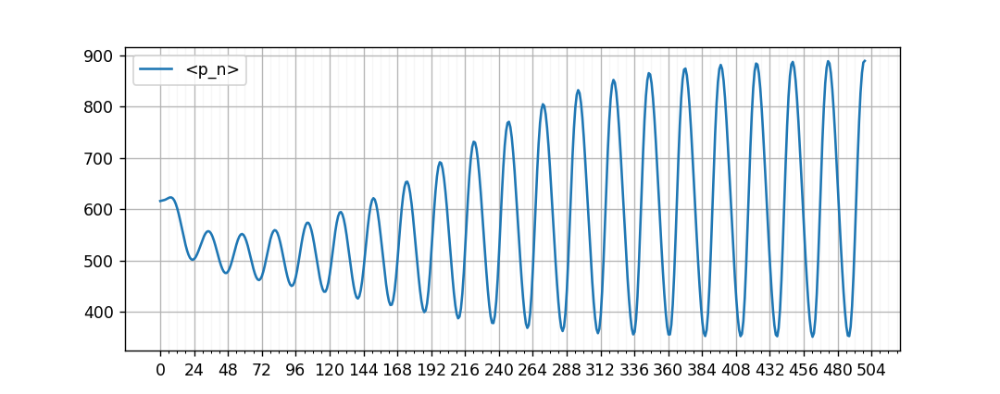

In [30]:
setAxis()
lines = plt.plot(SOL100SmallDiff.t[i0:i1], np.sum(cells.transpose(1,0,2)[3].transpose(1,0),1)[i0:i1]/Nc, label="<p_n>")
plt.legend()
plt.show()

<IPython.core.display.Javascript object>


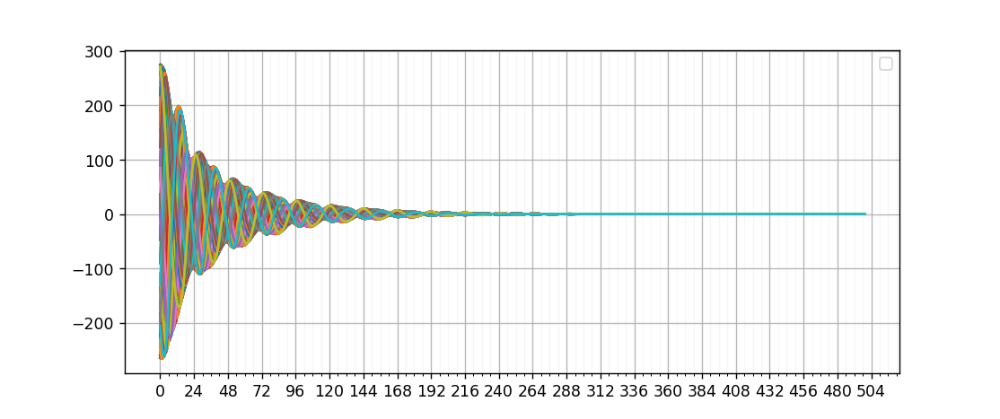

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


In [31]:
setAxis()
diff = cells.transpose(1,0,2)[3].transpose(1,0)-np.expand_dims(np.sum(cells.transpose(1,0,2)[3].transpose(1,0),1),1)/Nc
#cells -> sort by enzyme type -> take pn -> sort by time -> each entry are cells
i0 = 0
i1 = 500
lines = plt.plot(SOL100SmallDiff.t[i0:i1], diff[i0:i1])
# plt.legend(iter(lines), range(Nc), loc = 1)g
plt.legend()
# plt.ylim(-700,800)
plt.show()

<IPython.core.display.Javascript object>


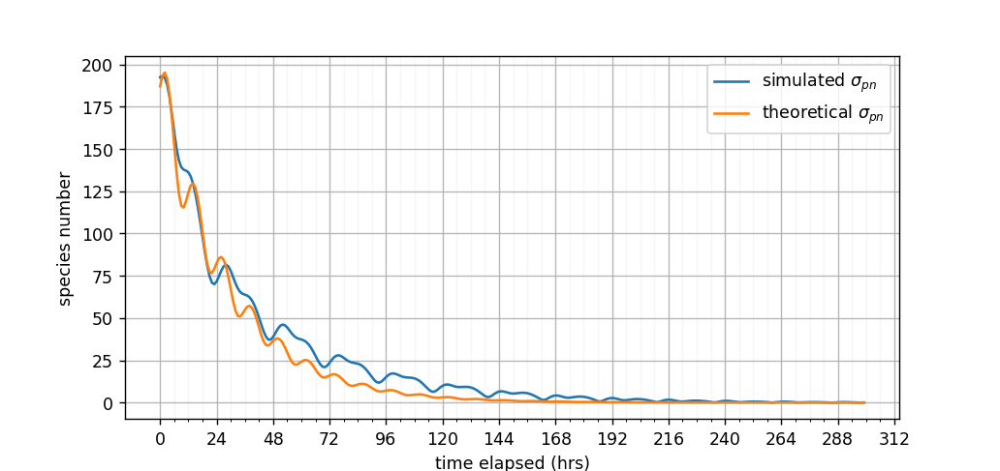

In [32]:
setAxis()
i0=0
i1=300
sigms = [np.std(diff[i]) for i in range(i0, i1)]
plt.plot(SOL100SmallDiff.t[i0:i1], sigms,  label="simulated $\sigma_{pn}$")
t = SOL100SmallDiff.t[i0:i1]
# plt.plot(t, 200*(np.exp(-t*epm*0.25)))
plt.plot(t,np.sqrt(np.abs(35000+10000*np.sin(2*nu*t)))*(np.exp(-t*epm*0.25)), label="theoretical $\sigma_{pn}$")
plt.xlabel("time elapsed (hrs)")
plt.ylabel("species number")
l=plt.legend()
# plt.plot(t, np.exp(t*epm*0.25)*sigms/200)
# plt.plot(t, sigms-200*(np.exp(-t*epm*0.25)))
# plt.plot(t,100*((t*epm/8)*np.exp(-t*epm/4)) +200*(np.exp(-t*epm*0.25)))
# plt.plot(t,100*((t*epm*0.25)**2*np.exp(-2*t*epm*0.25)-(t*epm*0.25)*np.exp(-4*t*epm*0.25)) )
# plt.plot(t,200*(np.exp(-t*epm*0.25))+100*((t*epm*0.25)**2*np.exp(-2*t*epm*0.25)-(t*epm*0.25)*np.exp(-4*t*epm*0.25)))

## Synchronization of system under parameter perturbation

In [20]:
### Large Nc = 1000
nu = 2*math.pi/24
gm = nu
dm = nu
gp = nu
dp = nu
epm = 3/22
muc = dm+epm
mus = epm
r = 5
b = 9
V=0.5
pn0 = 500

K=(r/4-1)*pn0*V+1
a=dm*dp*pn0*((K+pn0/V)/K)**r/b #alpha
# Cell number
Nc = 150

In [21]:
# Phase randomization
p1 = [ 2*math.pi*random.random() for i in range(Nc)]

In [59]:
# Parameter randomization
gmi = [gm*math.exp(rd.normal(0, 0.1)) for i in range (Nc)]
gpi = [gp*math.exp(rd.normal(0, 0.1)) for i in range (Nc)]
dpi = [dp*math.exp(rd.normal(0, 0.1)) for i in range (Nc)]
# Random epm rates
epmi = [epm*math.exp(rd.normal(0, 0.1)) for i in range (Nc)]
muci = [epmi[i]+dm for i in range (Nc)]
ai = [a*math.exp(rd.normal(0,0.1)) for i in range(Nc)]
musi = epmi

In [34]:
# print(p1)
p1 = [4.804969855796695, 1.0294329700912948, 2.012964618955888, 3.412189796684, 2.15559270575496, 1.2604999155947916, 1.6975359113343453, 1.9216115194883707, 4.061136100561378, 4.39432318701998, 5.523757797946249, 0.5335689821569956, 1.4016535812660407, 2.0064731718782522, 5.9382320778310484, 4.923541749615879, 6.057429758879983, 5.5597943805706596, 4.560498096239658, 1.9284779028417003, 1.8461555216376282, 4.423534511526533, 4.785055865886136, 3.791492764637156, 3.1723902575529115, 6.212545914699373, 0.5108252727032121, 3.1855028814736, 2.9108317856195374, 1.478952368515612, 4.257857628563645, 5.510418479416443, 0.9318393435500184, 3.7461863926007823, 5.544643970272602, 5.847251315873583, 5.244497909237006, 3.406848315363366, 5.618556032945834, 0.3805799635020331, 1.140603141740864, 4.514299700188368, 6.1152492531823635, 4.664730122922039, 0.5593459677821148, 1.8118324214447346, 1.5887489092846574, 5.157913848624147, 1.0015514545490214, 6.274704851694044, 2.201435078693987, 2.299323689323535, 4.707809489423218, 0.4392074170886628, 1.0289684490835833, 2.543637308847669, 2.7864544502121706, 2.1000203881371258, 6.17245398739366, 1.2970161851335145, 6.05535200704325, 1.6551468217838625, 4.350055593365616, 2.8453472434632014, 1.6735032188264565, 4.202705094342952, 3.985671950341843, 4.031500883779604, 6.072747376882493, 5.844045773301401, 1.7027114002900336, 3.70124294861443, 4.431001376825051, 5.683124484568048, 3.370843741030144, 4.823797618482998, 3.8183675013060023, 4.747710307833231, 3.1681319921725315, 2.733753732007416, 5.175763842050779, 0.015469612078822949, 1.7118844390420815, 1.4759092258731197, 2.5358561488325195, 1.6653502382256626, 3.3273149225018295, 3.8754282040230983, 1.1312909122076251, 0.03446693747660195, 0.5066876712042301, 5.4545404377390785, 2.5034790157433657, 2.3270312647963887, 4.299235872920485, 5.488494761522118, 2.587775428150125, 2.978568977753655, 3.593386040808667, 0.33369500778889566, 2.958001521800068, 4.584788993244197, 1.1506960616839008, 2.1492108191189083, 3.9816311598183196, 1.090935411650931, 2.189223000520201, 5.919996464027195, 2.949477657237806, 6.255074896065636, 2.045467733828905, 5.351562980759273, 0.9916659913952691, 5.897290104111269, 4.5522158656244525, 3.5090469952570356, 5.363011439969218, 1.4374218005034674, 2.533900091803923, 5.4404069274246405, 0.2178654767811202, 5.604208202447362, 3.4290489045846306, 2.310351573733266, 4.155423831028272, 3.310530610414571, 2.868272974325894, 0.5428996466694541, 1.818864753666667, 2.9334794990402195, 3.7164632396588226, 1.721328377219496, 3.2706593292531543, 6.274054286634836, 3.7443828642524504, 2.6906075836955257, 0.05938919794638378, 1.1734829534720834, 0.9147399049843356, 3.11420947115426, 4.325830561488094, 3.9836345478693915, 4.996248693270793, 1.4010556897549165, 0.3784450062088365, 3.9361081447846007, 5.135761131020027, 2.82499468597243, 5.035381840310782, 1.4229861605440035]

In [35]:
print(np.sum(musi))

20.524673445109464


In [60]:

t0 = 0
# Correlated functionals
def funcs(t, ys):
#     # For progress tracking
#     last_t, dt = state
    
#     # let's subdivide t_span into 1000 parts
#     # call update(n) here where n = (t - last_t) / dt
#     time.sleep(0.1)
#     n = int((t - last_t)/dt)
#     pbar.update(n)
    
#     # we need this to take into account that n is a rounded number.
#     state[0] = last_t + dt * n
    
    mn= ys[0:Nc]
    mc = ys[Nc:Nc*2]
    pc = ys[Nc*2:Nc*3]
    pn = ys[Nc*3:Nc*4]
    ms = ys[Nc*4]
    dmn =  [ai[i]*(K/(K+pn[i]/V))**r-gmi[i]*mn[i] for i in range(Nc)]
    dmc = [gmi[i]*mn[i]-muci[i]*mc[i] + musi[i]*ms for i in range(Nc)]
    dpc= [b*mc[i]-gpi[i]*pc[i] for i in range(Nc)]
    dpn = [gpi[i]*pc[i]-dpi[i]*pn[i] for i in range(Nc)]
    # Blood mRNA sync
    dms = np.dot(muci,mc)-ms*np.sum(musi)-dm*ms*Nc
    return dmn+dmc+dpc+dpn+[dms]


In [61]:

y0 = []
for n in range(Nc):
    ## Initialize at random phases
    y0 += standardized.getPhase(p1[n]).tolist()
y0 = np.array(y0).reshape(Nc,4).transpose(1,0).reshape(4*Nc).tolist()
y0 += [0]

t1 = 2000
# with tqdm(total=1000, unit="‰") as pbar:
#     sol = solve_ivp(
#         funcs,
#         [0, t1],
#         y0,
#         t_eval=np.linspace(0,t1, 2000),
#         args=[pbar, [t0, (t1-t0)/1000]],
#         rtol = 1e-5
#     )
SOL100SmallDiff = solve_ivp(funcs, [0, t1], y0, t_eval = np.linspace(0,t1, 2000), rtol = 1e-15)

In [62]:
cells = SOL100SmallDiff.y[:-1].reshape(4, Nc, -1).transpose(1, 0, 2) #sort by cell, then enzyme type, then time
# SOL1000 = sol

<IPython.core.display.Javascript object>


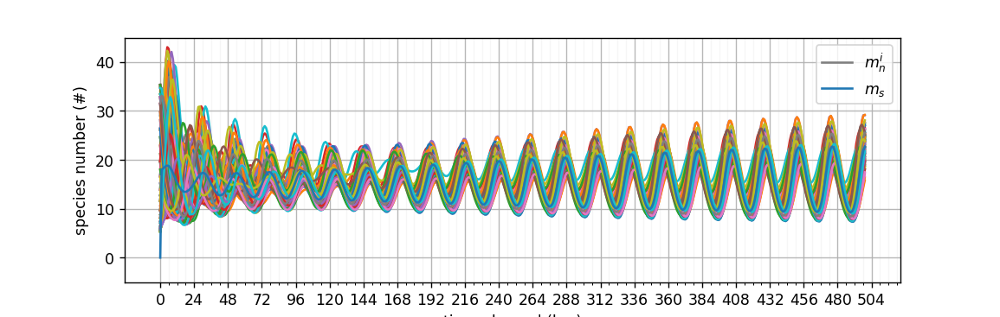

In [63]:
setAxis(24)

i0 = 0
i1 = 500

#cells -> sort by enzyme type -> take mc -> sort by time -> each entry are cells
lines = plt.plot(SOL100SmallDiff.t[i0:i1], cells.transpose(1,0,2)[1].transpose(1,0)[i0:i1])
line2 = plt.plot(SOL100SmallDiff.t[i0:i1], SOL100SmallDiff.y[-1][i0:i1], label = "blood mRNA concentration")
plt.xlabel("time elapsed (hrs)")
plt.ylabel("species number (#)")
# plt.legend(iter(lines), range(Nc), loc = 1)
plt.legend(iter([lines[7],line2[0]]), ("$m_n^i$","$m_s$"), loc=1)
plt.ylim(-5,45)
plt.show()

<IPython.core.display.Javascript object>


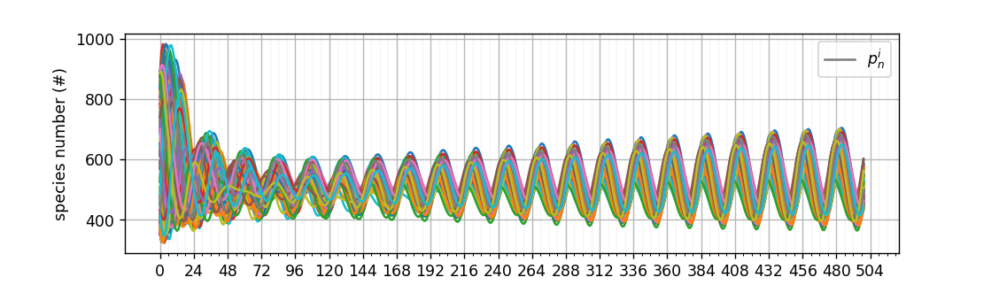

In [64]:
setAxis(24)

i0 = 0
i1 = 500

#cells -> sort by enzyme type -> take pn -> sort by time -> each entry are cells
lines = plt.plot(SOL100SmallDiff.t[i0:i1], cells.transpose(1,0,2)[3].transpose(1,0)[i0:i1])
# plt.legend(iter(lines), range(Nc), loc = 1)g
plt.legend([lines[7]],["$p_n^i$"], loc=1)
plt.xlabel("time elapsed (hrs)")
plt.ylabel("species number (#)")
# plt.ylim(200,1400)
plt.show()

### Mean Field

<IPython.core.display.Javascript object>


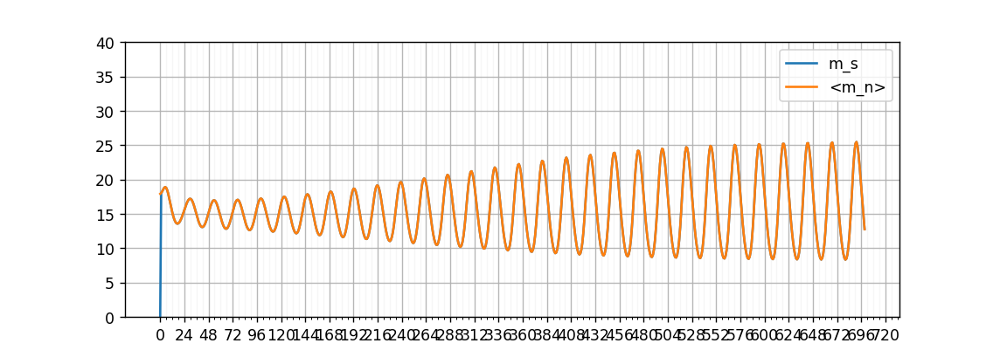

In [41]:
setAxis()
i1=700
#cells -> sort by enzyme type -> take pn -> sort by time -> each entry are cells
plt.plot(SOL100SmallDiff.t[i0:i1], SOL100SmallDiff.y[Nc*4][i0:i1], label="m_s")
lines = plt.plot(SOL100SmallDiff.t[i0:i1], np.sum(cells.transpose(1,0,2)[1].transpose(1,0),1)[i0:i1]/Nc, label="<m_n>")
# plt.legend(iter(lines), range(Nc), loc = 1)g
plt.legend(loc = 1)
plt.ylim(0,40)
plt.show()

<IPython.core.display.Javascript object>


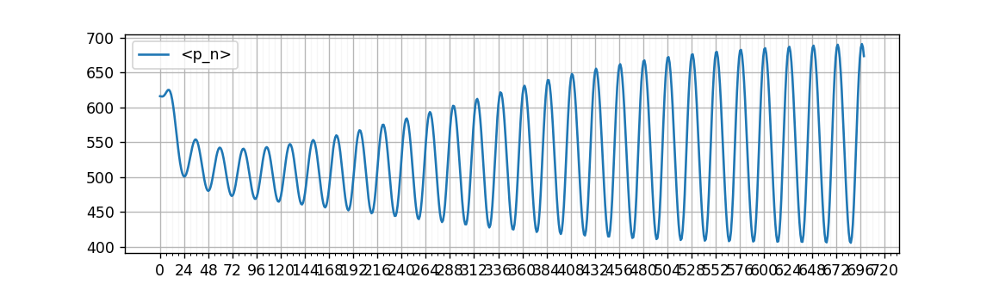

In [43]:
setAxis()
lines = plt.plot(SOL100SmallDiff.t[i0:i1], np.sum(cells.transpose(1,0,2)[3].transpose(1,0),1)[i0:i1]/Nc, label="<p_n>")
plt.legend()
plt.show()

<IPython.core.display.Javascript object>


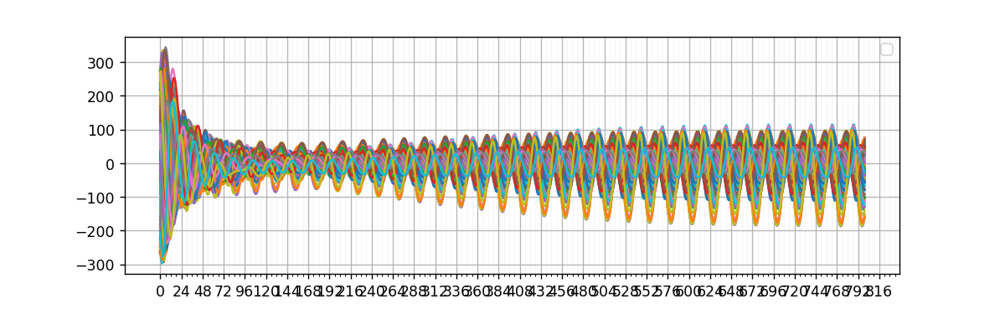

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


In [44]:
setAxis()
diff = cells.transpose(1,0,2)[3].transpose(1,0)-np.expand_dims(np.sum(cells.transpose(1,0,2)[3].transpose(1,0),1),1)/Nc
#cells -> sort by enzyme type -> take pn -> sort by time -> each entry are cells
i0 = 0
i1 = 800
lines = plt.plot(SOL100SmallDiff.t[i0:i1], diff[i0:i1])
# plt.legend(iter(lines), range(Nc), loc = 1)g
plt.legend()
# plt.ylim(-700,800)
plt.show()

<IPython.core.display.Javascript object>


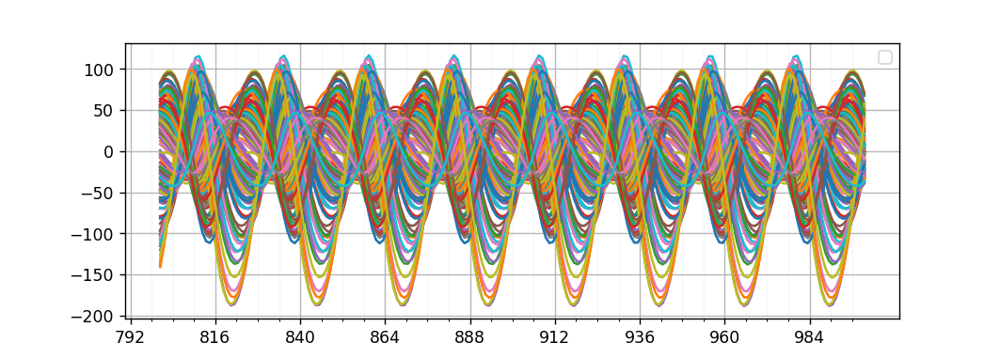

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


In [45]:
setAxis()
diff = cells.transpose(1,0,2)[3].transpose(1,0)-np.expand_dims(np.sum(cells.transpose(1,0,2)[3].transpose(1,0),1),1)/Nc
#cells -> sort by enzyme type -> take pn -> sort by time -> each entry are cells
i0 = 800
i1 = 1000
lines = plt.plot(SOL100SmallDiff.t[i0:i1], diff[i0:i1])
# plt.legend(iter(lines), range(Nc), loc = 1)g
plt.legend()
# plt.ylim(-700,800)
plt.show()

<IPython.core.display.Javascript object>


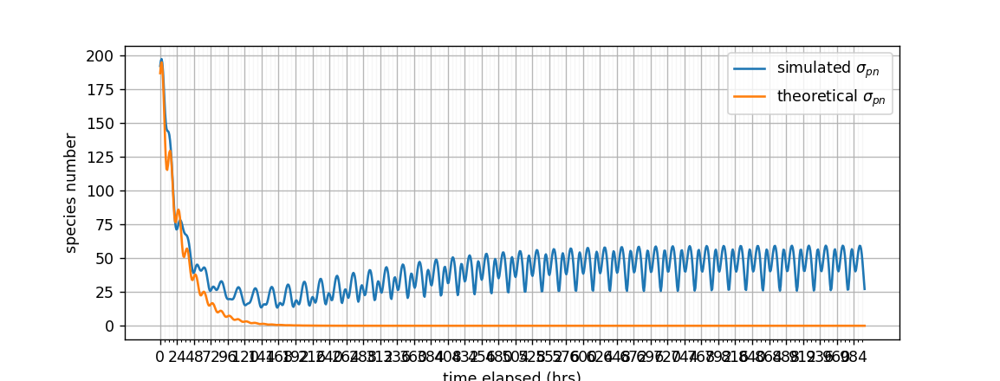

In [46]:
setAxis()
i0=0
i1=1000
sigms = [np.std(diff[i]) for i in range(i0, i1)]
plt.plot(SOL100SmallDiff.t[i0:i1], sigms,  label="simulated $\sigma_{pn}$")
t = SOL100SmallDiff.t[i0:i1]
# plt.plot(t, 200*(np.exp(-t*epm*0.25)))
plt.plot(t,np.sqrt(np.abs(35000+10000*np.sin(2*nu*t)))*(np.exp(-t*epm*0.25)), label="theoretical $\sigma_{pn}$")
plt.xlabel("time elapsed (hrs)")
plt.ylabel("species number")
l=plt.legend()
# plt.plot(t, np.exp(t*epm*0.25)*sigms/200)
# plt.plot(t, sigms-200*(np.exp(-t*epm*0.25)))
# plt.plot(t,100*((t*epm/8)*np.exp(-t*epm/4)) +200*(np.exp(-t*epm*0.25)))
# plt.plot(t,100*((t*epm*0.25)**2*np.exp(-2*t*epm*0.25)-(t*epm*0.25)*np.exp(-4*t*epm*0.25)) )
# plt.plot(t,200*(np.exp(-t*epm*0.25))+100*((t*epm*0.25)**2*np.exp(-2*t*epm*0.25)-(t*epm*0.25)*np.exp(-4*t*epm*0.25)))

### Parameter perturbation 2: $\sigma_p = 0.01$

In [102]:
### Large Nc = 1000
nu = 2*math.pi/24
gm = nu
dm = nu
gp = nu
dp = nu
epm = 3/22
muc = dm+epm
mus = epm
r = 5
b = 9
V=0.5
pn0 = 500

K=(r/4-1)*pn0*V+1
a=dm*dp*pn0*((K+pn0/V)/K)**r/b #alpha
# Cell number
Nc = 150

In [103]:
# Phase randomization
p1 = [ 2*math.pi*random.random() for i in range(Nc)]

In [104]:
# Parameter randomization
gmi = [gm*math.exp(rd.normal(0, 0.01)) for i in range (Nc)]
gpi = [gp*math.exp(rd.normal(0, 0.01)) for i in range (Nc)]
dpi = [dp*math.exp(rd.normal(0, 0.01)) for i in range (Nc)]
muci = [epm+dms[i] for i in range (Nc)]

In [105]:
# print(p1)
p1 = [4.804969855796695, 1.0294329700912948, 2.012964618955888, 3.412189796684, 2.15559270575496, 1.2604999155947916, 1.6975359113343453, 1.9216115194883707, 4.061136100561378, 4.39432318701998, 5.523757797946249, 0.5335689821569956, 1.4016535812660407, 2.0064731718782522, 5.9382320778310484, 4.923541749615879, 6.057429758879983, 5.5597943805706596, 4.560498096239658, 1.9284779028417003, 1.8461555216376282, 4.423534511526533, 4.785055865886136, 3.791492764637156, 3.1723902575529115, 6.212545914699373, 0.5108252727032121, 3.1855028814736, 2.9108317856195374, 1.478952368515612, 4.257857628563645, 5.510418479416443, 0.9318393435500184, 3.7461863926007823, 5.544643970272602, 5.847251315873583, 5.244497909237006, 3.406848315363366, 5.618556032945834, 0.3805799635020331, 1.140603141740864, 4.514299700188368, 6.1152492531823635, 4.664730122922039, 0.5593459677821148, 1.8118324214447346, 1.5887489092846574, 5.157913848624147, 1.0015514545490214, 6.274704851694044, 2.201435078693987, 2.299323689323535, 4.707809489423218, 0.4392074170886628, 1.0289684490835833, 2.543637308847669, 2.7864544502121706, 2.1000203881371258, 6.17245398739366, 1.2970161851335145, 6.05535200704325, 1.6551468217838625, 4.350055593365616, 2.8453472434632014, 1.6735032188264565, 4.202705094342952, 3.985671950341843, 4.031500883779604, 6.072747376882493, 5.844045773301401, 1.7027114002900336, 3.70124294861443, 4.431001376825051, 5.683124484568048, 3.370843741030144, 4.823797618482998, 3.8183675013060023, 4.747710307833231, 3.1681319921725315, 2.733753732007416, 5.175763842050779, 0.015469612078822949, 1.7118844390420815, 1.4759092258731197, 2.5358561488325195, 1.6653502382256626, 3.3273149225018295, 3.8754282040230983, 1.1312909122076251, 0.03446693747660195, 0.5066876712042301, 5.4545404377390785, 2.5034790157433657, 2.3270312647963887, 4.299235872920485, 5.488494761522118, 2.587775428150125, 2.978568977753655, 3.593386040808667, 0.33369500778889566, 2.958001521800068, 4.584788993244197, 1.1506960616839008, 2.1492108191189083, 3.9816311598183196, 1.090935411650931, 2.189223000520201, 5.919996464027195, 2.949477657237806, 6.255074896065636, 2.045467733828905, 5.351562980759273, 0.9916659913952691, 5.897290104111269, 4.5522158656244525, 3.5090469952570356, 5.363011439969218, 1.4374218005034674, 2.533900091803923, 5.4404069274246405, 0.2178654767811202, 5.604208202447362, 3.4290489045846306, 2.310351573733266, 4.155423831028272, 3.310530610414571, 2.868272974325894, 0.5428996466694541, 1.818864753666667, 2.9334794990402195, 3.7164632396588226, 1.721328377219496, 3.2706593292531543, 6.274054286634836, 3.7443828642524504, 2.6906075836955257, 0.05938919794638378, 1.1734829534720834, 0.9147399049843356, 3.11420947115426, 4.325830561488094, 3.9836345478693915, 4.996248693270793, 1.4010556897549165, 0.3784450062088365, 3.9361081447846007, 5.135761131020027, 2.82499468597243, 5.035381840310782, 1.4229861605440035]

In [106]:

t0 = 0
# Correlated functionals
def funcs(t, ys):
#     # For progress tracking
#     last_t, dt = state
    
#     # let's subdivide t_span into 1000 parts
#     # call update(n) here where n = (t - last_t) / dt
#     time.sleep(0.1)
#     n = int((t - last_t)/dt)
#     pbar.update(n)
    
#     # we need this to take into account that n is a rounded number.
#     state[0] = last_t + dt * n
    
    mn= ys[0:Nc]
    mc = ys[Nc:Nc*2]
    pc = ys[Nc*2:Nc*3]
    pn = ys[Nc*3:Nc*4]
    ms = ys[Nc*4]
    dmn =  [a*(K/(K+pn[i]/V))**r-gmi[i]*mn[i] for i in range(Nc)]
    dmc = [gmi[i]*mn[i]-muci[i]*mc[i] + mus*ms for i in range(Nc)]
    dpc= [b*mc[i]-gpi[i]*pc[i] for i in range(Nc)]
    dpn = [gpi[i]*pc[i]-dpi[i]*pn[i] for i in range(Nc)]
    # Blood mRNA sync
    dms = np.dot(muci,mc)-Nc*ms*mus-dm*ms*Nc
    return dmn+dmc+dpc+dpn+[dms]


In [107]:

y0 = []
for n in range(Nc):
    ## Initialize at random phases
    y0 += standardized.getPhase(p1[n]).tolist()
y0 = np.array(y0).reshape(Nc,4).transpose(1,0).reshape(4*Nc).tolist()
y0 += [0]

t1 = 2000
# with tqdm(total=1000, unit="‰") as pbar:
#     sol = solve_ivp(
#         funcs,
#         [0, t1],
#         y0,
#         t_eval=np.linspace(0,t1, 2000),
#         args=[pbar, [t0, (t1-t0)/1000]],
#         rtol = 1e-5
#     )
SOL100SmallDiff = solve_ivp(funcs, [0, t1], y0, t_eval = np.linspace(0,t1, 2000), rtol = 1e-15)

In [108]:
cells = SOL100SmallDiff.y[:-1].reshape(4, Nc, -1).transpose(1, 0, 2) #sort by cell, then enzyme type, then time
# SOL1000 = sol

<IPython.core.display.Javascript object>


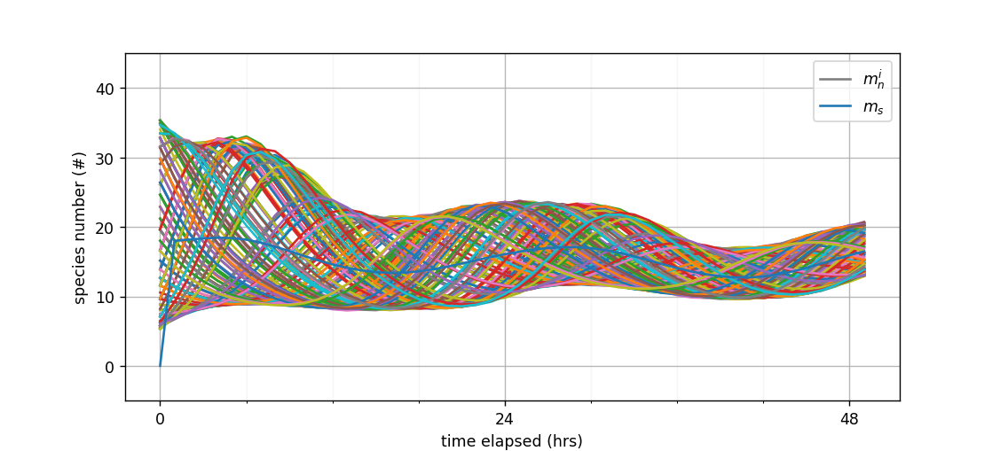

In [116]:
setAxis(24)

i0 = 0
i1 = 50

#cells -> sort by enzyme type -> take mc -> sort by time -> each entry are cells
lines = plt.plot(SOL100SmallDiff.t[i0:i1], cells.transpose(1,0,2)[1].transpose(1,0)[i0:i1])
line2 = plt.plot(SOL100SmallDiff.t[i0:i1], SOL100SmallDiff.y[-1][i0:i1], label = "blood mRNA concentration")
plt.xlabel("time elapsed (hrs)")
plt.ylabel("species number (#)")
# plt.legend(iter(lines), range(Nc), loc = 1)
plt.legend(iter([lines[7],line2[0]]), ("$m_n^i$","$m_s$"), loc=1)
plt.ylim(-5,45)
plt.show()

<IPython.core.display.Javascript object>


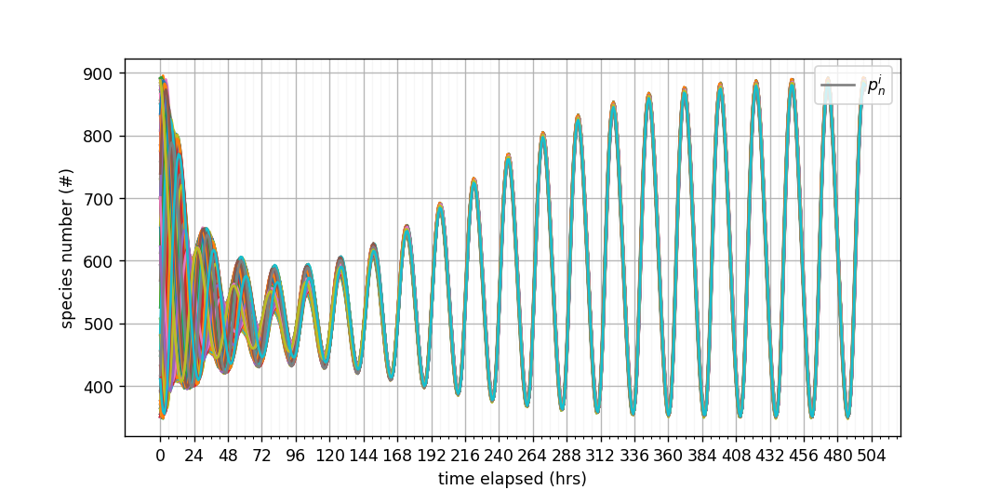

In [110]:
setAxis(24)

i0 = 0
i1 = 500

#cells -> sort by enzyme type -> take pn -> sort by time -> each entry are cells
lines = plt.plot(SOL100SmallDiff.t[i0:i1], cells.transpose(1,0,2)[3].transpose(1,0)[i0:i1])
# plt.legend(iter(lines), range(Nc), loc = 1)g
plt.legend([lines[7]],["$p_n^i$"], loc=1)
plt.xlabel("time elapsed (hrs)")
plt.ylabel("species number (#)")
# plt.ylim(200,1400)
plt.show()

### Mean Field

<IPython.core.display.Javascript object>


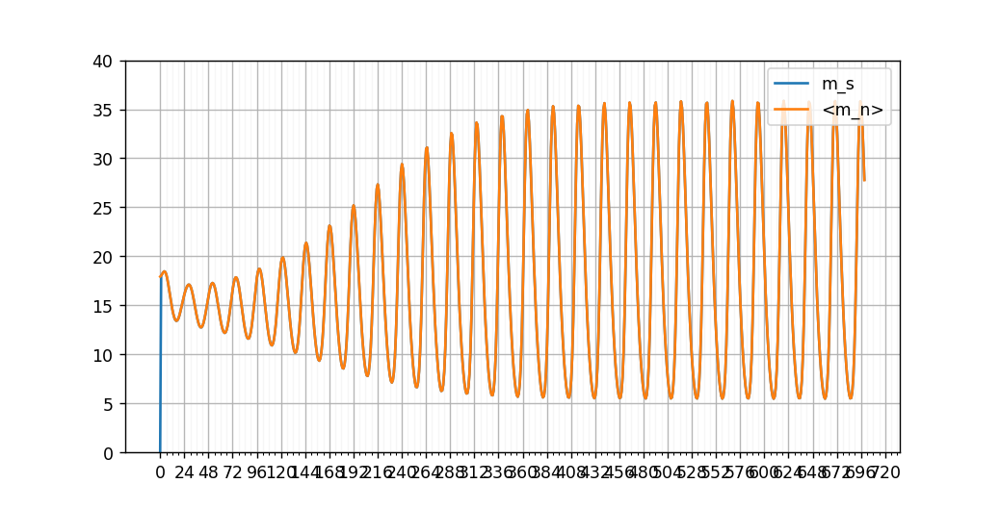

In [111]:
setAxis()
i1=700
#cells -> sort by enzyme type -> take pn -> sort by time -> each entry are cells
plt.plot(SOL100SmallDiff.t[i0:i1], SOL100SmallDiff.y[Nc*4][i0:i1], label="m_s")
lines = plt.plot(SOL100SmallDiff.t[i0:i1], np.sum(cells.transpose(1,0,2)[1].transpose(1,0),1)[i0:i1]/Nc, label="<m_n>")
# plt.legend(iter(lines), range(Nc), loc = 1)g
plt.legend(loc = 1)
plt.ylim(0,40)
plt.show()

<IPython.core.display.Javascript object>


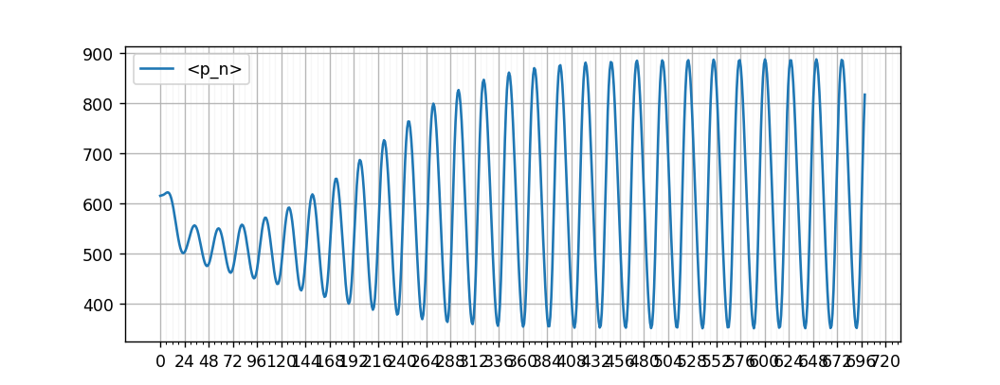

In [112]:
setAxis()
lines = plt.plot(SOL100SmallDiff.t[i0:i1], np.sum(cells.transpose(1,0,2)[3].transpose(1,0),1)[i0:i1]/Nc, label="<p_n>")
plt.legend()
plt.show()

<IPython.core.display.Javascript object>


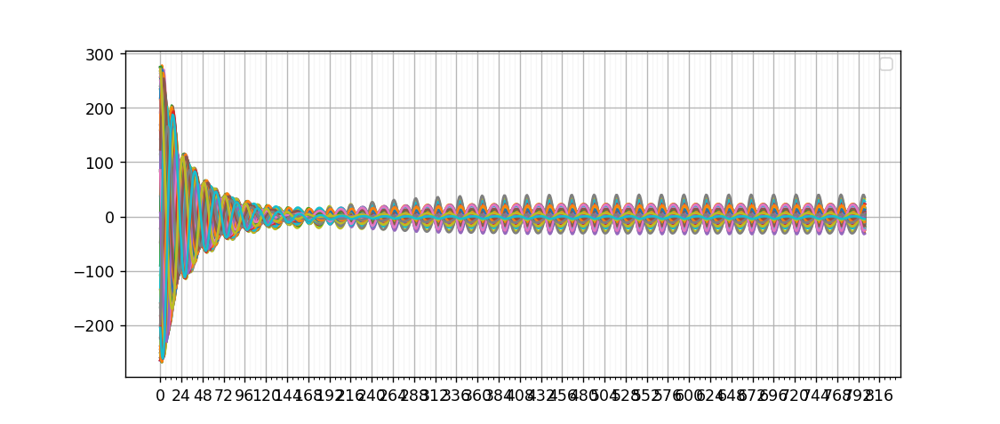

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


In [113]:
setAxis()
diff = cells.transpose(1,0,2)[3].transpose(1,0)-np.expand_dims(np.sum(cells.transpose(1,0,2)[3].transpose(1,0),1),1)/Nc
#cells -> sort by enzyme type -> take pn -> sort by time -> each entry are cells
i0 = 0
i1 = 800
lines = plt.plot(SOL100SmallDiff.t[i0:i1], diff[i0:i1])
# plt.legend(iter(lines), range(Nc), loc = 1)g
plt.legend()
# plt.ylim(-700,800)
plt.show()

<IPython.core.display.Javascript object>


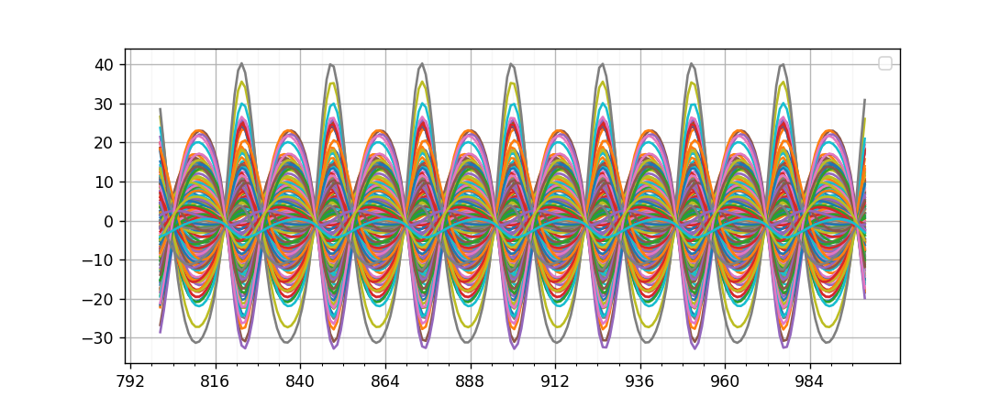

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


In [114]:
setAxis()
diff = cells.transpose(1,0,2)[3].transpose(1,0)-np.expand_dims(np.sum(cells.transpose(1,0,2)[3].transpose(1,0),1),1)/Nc
#cells -> sort by enzyme type -> take pn -> sort by time -> each entry are cells
i0 = 800
i1 = 1000
lines = plt.plot(SOL100SmallDiff.t[i0:i1], diff[i0:i1])
# plt.legend(iter(lines), range(Nc), loc = 1)g
plt.legend()
# plt.ylim(-700,800)
plt.show()

<IPython.core.display.Javascript object>


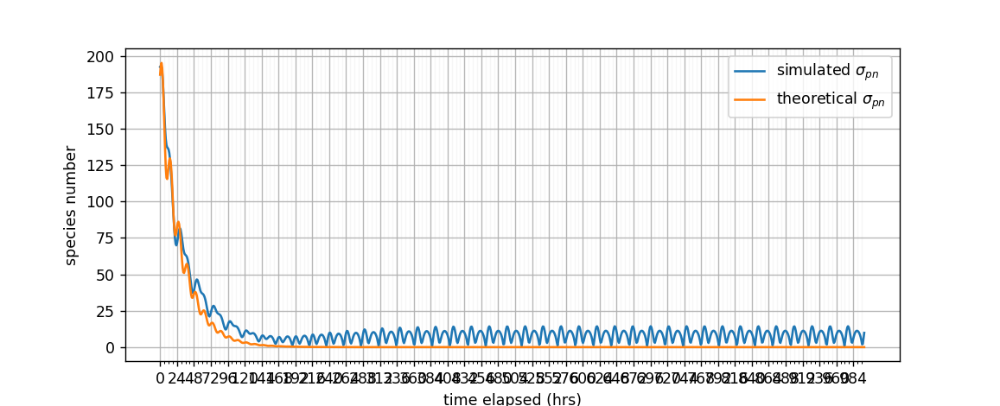

In [115]:
setAxis()
i0=0
i1=1000
sigms = [np.std(diff[i]) for i in range(i0, i1)]
plt.plot(SOL100SmallDiff.t[i0:i1], sigms,  label="simulated $\sigma_{pn}$")
t = SOL100SmallDiff.t[i0:i1]
# plt.plot(t, 200*(np.exp(-t*epm*0.25)))
plt.plot(t,np.sqrt(np.abs(35000+10000*np.sin(2*nu*t)))*(np.exp(-t*epm*0.25)), label="theoretical $\sigma_{pn}$")
plt.xlabel("time elapsed (hrs)")
plt.ylabel("species number")
l=plt.legend()
# plt.plot(t, np.exp(t*epm*0.25)*sigms/200)
# plt.plot(t, sigms-200*(np.exp(-t*epm*0.25)))
# plt.plot(t,100*((t*epm/8)*np.exp(-t*epm/4)) +200*(np.exp(-t*epm*0.25)))
# plt.plot(t,100*((t*epm*0.25)**2*np.exp(-2*t*epm*0.25)-(t*epm*0.25)*np.exp(-4*t*epm*0.25)) )
# plt.plot(t,200*(np.exp(-t*epm*0.25))+100*((t*epm*0.25)**2*np.exp(-2*t*epm*0.25)-(t*epm*0.25)*np.exp(-4*t*epm*0.25)))

### Orbit visualizations of perturbed parameters

<IPython.core.display.Javascript object>


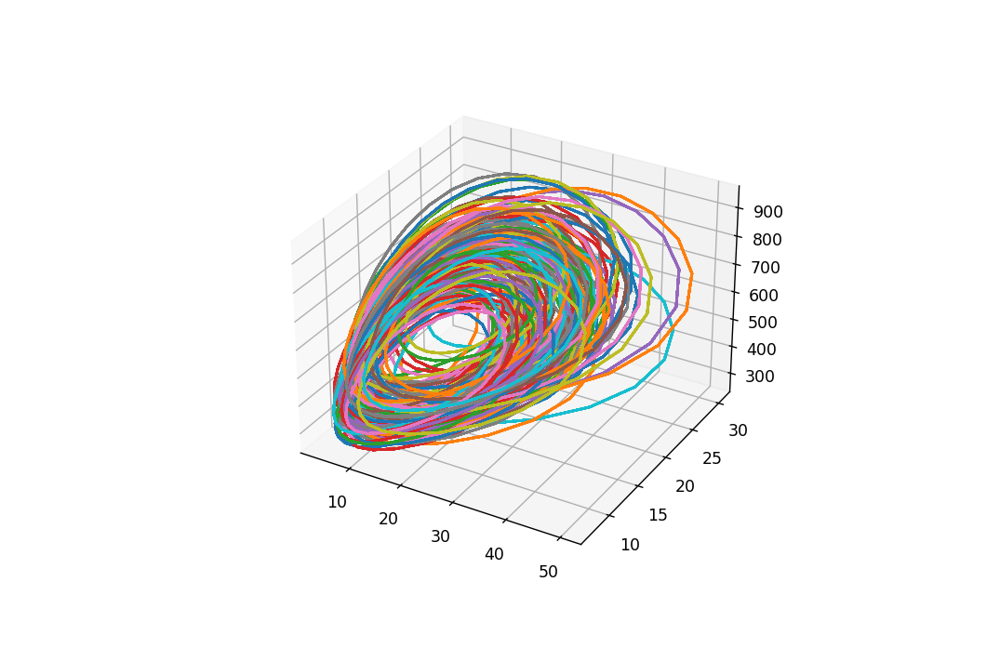

In [65]:
fig = plt.figure()
ax = plt.axes(projection='3d')
i0 = 1500
i1 = 1700
# ax.plot3D(xline, yline, zline, 'gray')
#cells -> sort by enzyme type -> take mc -> sort by time -> each entry are cells
# lines = plt.plot(SOL100SmallDiff.t[i0:i1], cells.transpose(1,0,2)[1].transpose(1,0)[i0:i1])
for i in range(Nc):
    ax.plot3D( cells.transpose(1,0,2)[0].transpose(1,0)[i0:i1].transpose()[i],  cells.transpose(1,0,2)[1].transpose(1,0)[i0:i1].transpose()[i], 
           cells.transpose(1,0,2)[2].transpose(1,0)[i0:i1].transpose()[i])

<IPython.core.display.Javascript object>


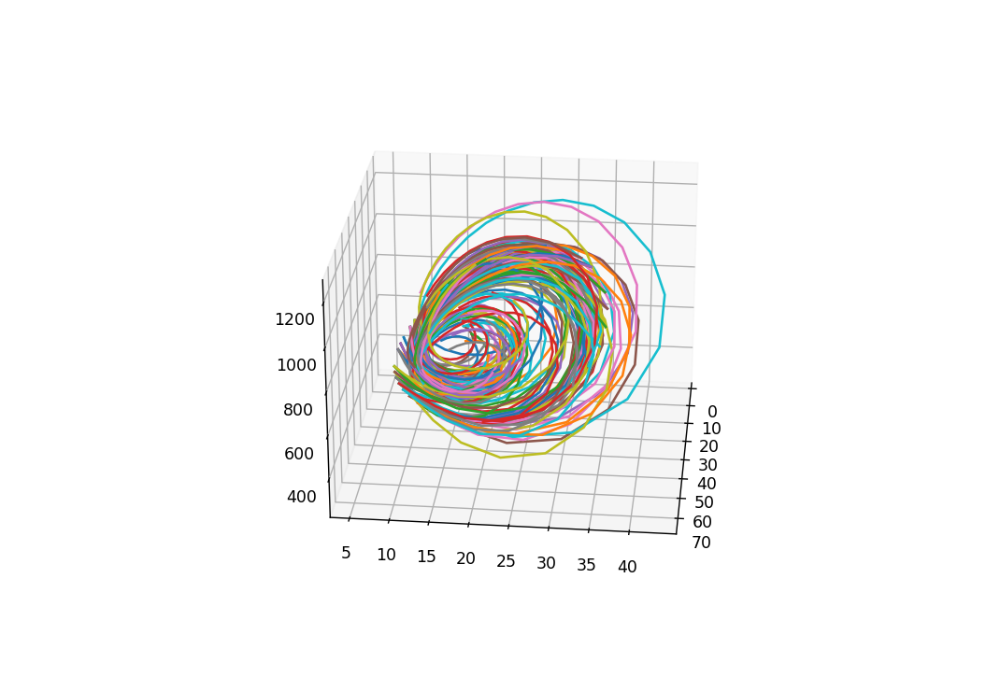

In [53]:
fig = plt.figure()
ax = plt.axes(projection='3d')
i0 = 0
i1 = 20
# ax.plot3D(xline, yline, zline, 'gray')
#cells -> sort by enzyme type -> take mc -> sort by time -> each entry are cells
# lines = plt.plot(SOL100SmallDiff.t[i0:i1], cells.transpose(1,0,2)[1].transpose(1,0)[i0:i1])
for i in range(Nc):
    ax.plot3D( cells.transpose(1,0,2)[0].transpose(1,0)[i0:i1].transpose()[i],  cells.transpose(1,0,2)[1].transpose(1,0)[i0:i1].transpose()[i], 
           cells.transpose(1,0,2)[2].transpose(1,0)[i0:i1].transpose()[i])

## Testing synchronization on purely linear systems

In [9]:
### Large Nc = 1000
nu = 2*math.pi/24
gm = nu
dm = nu
gp = nu
dp = nu
epm = 3/22
muc = dm+epm
mus = epm
r = 5
b = 9
V=0.5
pn0 = 500

K=(r/4-1)*pn0*V+1
a=dm*dp*pn0*((K+pn0/V)/K)**r/b #alpha
# Cell number
Nc = 150

In [10]:
# Phase randomization
p1 = [ 2*math.pi*random.random() for i in range(Nc)]

In [16]:
# Parameter randomization
gmi = [gm*math.exp(rd.normal(0, 0.1)) for i in range (Nc)]
gpi = [gp*math.exp(rd.normal(0, 0.1)) for i in range (Nc)]
dpi = [dp*math.exp(rd.normal(0, 0.1)) for i in range (Nc)]
# Random epm rates
epmi = [epm*math.exp(rd.normal(0, 0.1)) for i in range (Nc)]
muci = [epmi[i]+dm for i in range (Nc)]
ai = [a*math.exp(rd.normal(0,0.1)) for i in range(Nc)]
musi = epmi

In [17]:
# print(p1)
p1 = [4.804969855796695, 1.0294329700912948, 2.012964618955888, 3.412189796684, 2.15559270575496, 1.2604999155947916, 1.6975359113343453, 1.9216115194883707, 4.061136100561378, 4.39432318701998, 5.523757797946249, 0.5335689821569956, 1.4016535812660407, 2.0064731718782522, 5.9382320778310484, 4.923541749615879, 6.057429758879983, 5.5597943805706596, 4.560498096239658, 1.9284779028417003, 1.8461555216376282, 4.423534511526533, 4.785055865886136, 3.791492764637156, 3.1723902575529115, 6.212545914699373, 0.5108252727032121, 3.1855028814736, 2.9108317856195374, 1.478952368515612, 4.257857628563645, 5.510418479416443, 0.9318393435500184, 3.7461863926007823, 5.544643970272602, 5.847251315873583, 5.244497909237006, 3.406848315363366, 5.618556032945834, 0.3805799635020331, 1.140603141740864, 4.514299700188368, 6.1152492531823635, 4.664730122922039, 0.5593459677821148, 1.8118324214447346, 1.5887489092846574, 5.157913848624147, 1.0015514545490214, 6.274704851694044, 2.201435078693987, 2.299323689323535, 4.707809489423218, 0.4392074170886628, 1.0289684490835833, 2.543637308847669, 2.7864544502121706, 2.1000203881371258, 6.17245398739366, 1.2970161851335145, 6.05535200704325, 1.6551468217838625, 4.350055593365616, 2.8453472434632014, 1.6735032188264565, 4.202705094342952, 3.985671950341843, 4.031500883779604, 6.072747376882493, 5.844045773301401, 1.7027114002900336, 3.70124294861443, 4.431001376825051, 5.683124484568048, 3.370843741030144, 4.823797618482998, 3.8183675013060023, 4.747710307833231, 3.1681319921725315, 2.733753732007416, 5.175763842050779, 0.015469612078822949, 1.7118844390420815, 1.4759092258731197, 2.5358561488325195, 1.6653502382256626, 3.3273149225018295, 3.8754282040230983, 1.1312909122076251, 0.03446693747660195, 0.5066876712042301, 5.4545404377390785, 2.5034790157433657, 2.3270312647963887, 4.299235872920485, 5.488494761522118, 2.587775428150125, 2.978568977753655, 3.593386040808667, 0.33369500778889566, 2.958001521800068, 4.584788993244197, 1.1506960616839008, 2.1492108191189083, 3.9816311598183196, 1.090935411650931, 2.189223000520201, 5.919996464027195, 2.949477657237806, 6.255074896065636, 2.045467733828905, 5.351562980759273, 0.9916659913952691, 5.897290104111269, 4.5522158656244525, 3.5090469952570356, 5.363011439969218, 1.4374218005034674, 2.533900091803923, 5.4404069274246405, 0.2178654767811202, 5.604208202447362, 3.4290489045846306, 2.310351573733266, 4.155423831028272, 3.310530610414571, 2.868272974325894, 0.5428996466694541, 1.818864753666667, 2.9334794990402195, 3.7164632396588226, 1.721328377219496, 3.2706593292531543, 6.274054286634836, 3.7443828642524504, 2.6906075836955257, 0.05938919794638378, 1.1734829534720834, 0.9147399049843356, 3.11420947115426, 4.325830561488094, 3.9836345478693915, 4.996248693270793, 1.4010556897549165, 0.3784450062088365, 3.9361081447846007, 5.135761131020027, 2.82499468597243, 5.035381840310782, 1.4229861605440035]

In [18]:
print(np.sum(musi))

20.661429936692294


#### Linear approximation to the non-linear term around the equilibrium point pn_0=500

`dmn = a*(K/(K+pn[i]/V))**r-gmi[i]*mn[i]`
$$\frac{d}{dt}m_n^{i} = a\left(\frac{K}{K+p_n^i/V}\right)^r-g_m^i*m_n^i$$
Up to the first order:
$$\frac{d}{dt}m_n^{i} = -ra\frac{K^r}{V(K+p_{n0}/V)^{r+1}}\delta p_n^i-g_m^i*m_n^i$$

In [26]:

t0 = 0
# Correlated functionals
def funcs(t, ys):
#     # For progress tracking
#     last_t, dt = state
    
#     # let's subdivide t_span into 1000 parts
#     # call update(n) here where n = (t - last_t) / dt
#     time.sleep(0.1)
#     n = int((t - last_t)/dt)
#     pbar.update(n)
    
#     # we need this to take into account that n is a rounded number.
#     state[0] = last_t + dt * n
    
    mn= ys[0:Nc]
    mc = ys[Nc:Nc*2]
    pc = ys[Nc*2:Nc*3]
    pn = ys[Nc*3:Nc*4]
    ms = ys[Nc*4]
    dmn =  [-r*0.76*ai[i]*(K**r/(K+pn0/V)**(r+1)/V)*(pn[i]-pn0)-gmi[i]*mn[i] for i in range(Nc)]
    dmc = [gmi[i]*mn[i]-muci[i]*mc[i] + musi[i]*ms for i in range(Nc)]
    dpc= [b*mc[i]-gpi[i]*pc[i] for i in range(Nc)]
    dpn = [gpi[i]*pc[i]-dpi[i]*pn[i] for i in range(Nc)]
    # Blood mRNA sync
    dms = np.dot(muci,mc)-ms*np.sum(musi)-dm*ms*Nc
    return dmn+dmc+dpc+dpn+[dms]


In [27]:

y0 = []
for n in range(Nc):
    ## Initialize at random phases
    y0 += standardized.getPhase(p1[n]).tolist()
y0 = np.array(y0).reshape(Nc,4).transpose(1,0).reshape(4*Nc).tolist()
y0 += [0]

t1 = 2000
# with tqdm(total=1000, unit="‰") as pbar:
#     sol = solve_ivp(
#         funcs,
#         [0, t1],
#         y0,
#         t_eval=np.linspace(0,t1, 2000),
#         args=[pbar, [t0, (t1-t0)/1000]],
#         rtol = 1e-5
#     )
SOL100SmallDiff = solve_ivp(funcs, [0, t1], y0, t_eval = np.linspace(0,t1, 2000), rtol = 1e-15)

In [28]:
cells = SOL100SmallDiff.y[:-1].reshape(4, Nc, -1).transpose(1, 0, 2) #sort by cell, then enzyme type, then time
# SOL1000 = sol

<IPython.core.display.Javascript object>


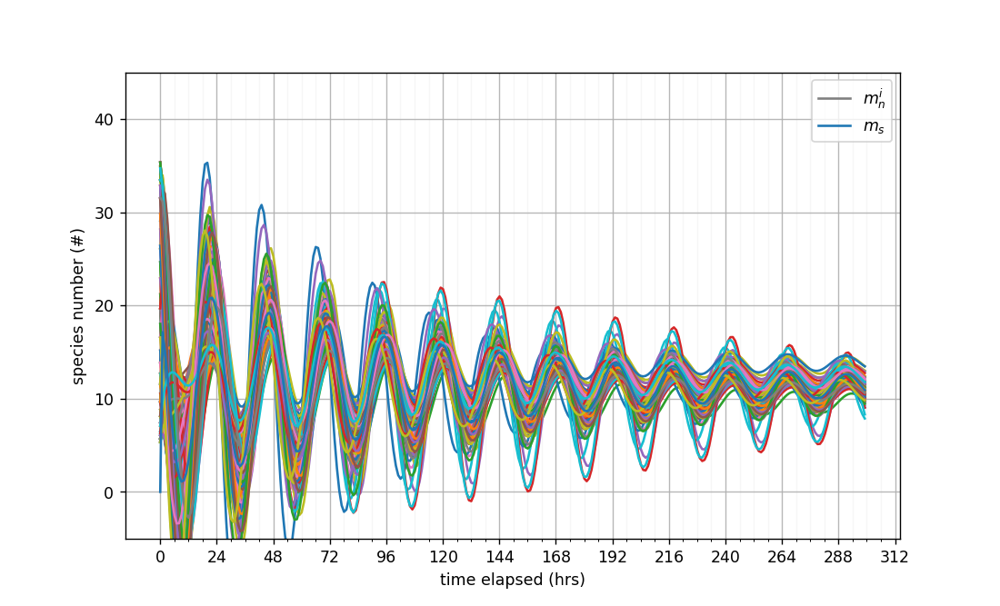

In [31]:
setAxis(24)

i0 = 0
i1 = 300

#cells -> sort by enzyme type -> take mc -> sort by time -> each entry are cells
lines = plt.plot(SOL100SmallDiff.t[i0:i1], cells.transpose(1,0,2)[1].transpose(1,0)[i0:i1])
line2 = plt.plot(SOL100SmallDiff.t[i0:i1], SOL100SmallDiff.y[-1][i0:i1], label = "blood mRNA concentration")
plt.xlabel("time elapsed (hrs)")
plt.ylabel("species number (#)")
# plt.legend(iter(lines), range(Nc), loc = 1)
plt.legend(iter([lines[7],line2[0]]), ("$m_n^i$","$m_s$"), loc=1)
plt.ylim(-5,45)
plt.show()

<IPython.core.display.Javascript object>


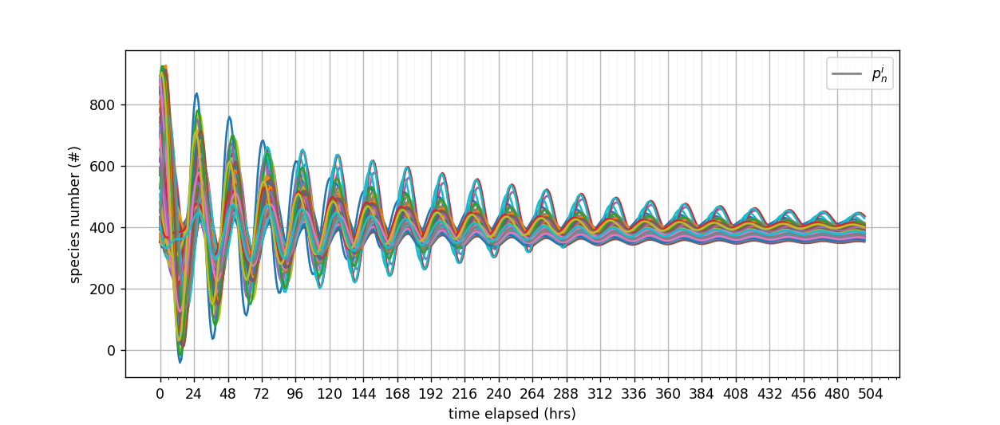

In [30]:
setAxis(24)

i0 = 0
i1 = 500

#cells -> sort by enzyme type -> take pn -> sort by time -> each entry are cells
lines = plt.plot(SOL100SmallDiff.t[i0:i1], cells.transpose(1,0,2)[3].transpose(1,0)[i0:i1])
# plt.legend(iter(lines), range(Nc), loc = 1)g
plt.legend([lines[7]],["$p_n^i$"], loc=1)
plt.xlabel("time elapsed (hrs)")
plt.ylabel("species number (#)")
# plt.ylim(200,1400)
plt.show()

### Mean Field

<IPython.core.display.Javascript object>


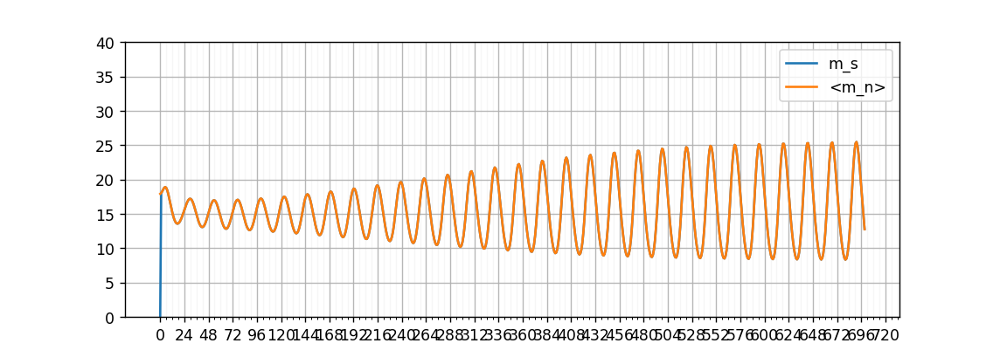

In [41]:
setAxis()
i1=700
#cells -> sort by enzyme type -> take pn -> sort by time -> each entry are cells
plt.plot(SOL100SmallDiff.t[i0:i1], SOL100SmallDiff.y[Nc*4][i0:i1], label="m_s")
lines = plt.plot(SOL100SmallDiff.t[i0:i1], np.sum(cells.transpose(1,0,2)[1].transpose(1,0),1)[i0:i1]/Nc, label="<m_n>")
# plt.legend(iter(lines), range(Nc), loc = 1)g
plt.legend(loc = 1)
plt.ylim(0,40)
plt.show()

<IPython.core.display.Javascript object>


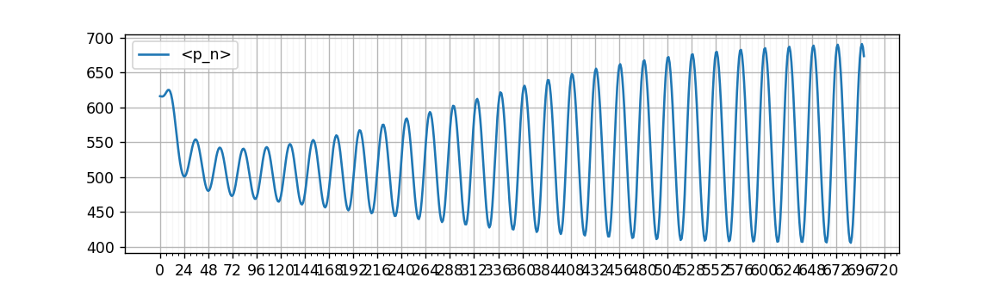

In [43]:
setAxis()
lines = plt.plot(SOL100SmallDiff.t[i0:i1], np.sum(cells.transpose(1,0,2)[3].transpose(1,0),1)[i0:i1]/Nc, label="<p_n>")
plt.legend()
plt.show()

<IPython.core.display.Javascript object>


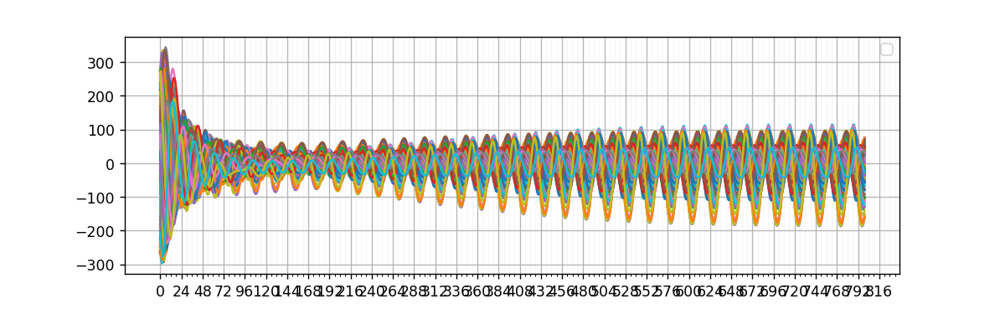

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


In [44]:
setAxis()
diff = cells.transpose(1,0,2)[3].transpose(1,0)-np.expand_dims(np.sum(cells.transpose(1,0,2)[3].transpose(1,0),1),1)/Nc
#cells -> sort by enzyme type -> take pn -> sort by time -> each entry are cells
i0 = 0
i1 = 800
lines = plt.plot(SOL100SmallDiff.t[i0:i1], diff[i0:i1])
# plt.legend(iter(lines), range(Nc), loc = 1)g
plt.legend()
# plt.ylim(-700,800)
plt.show()

<IPython.core.display.Javascript object>


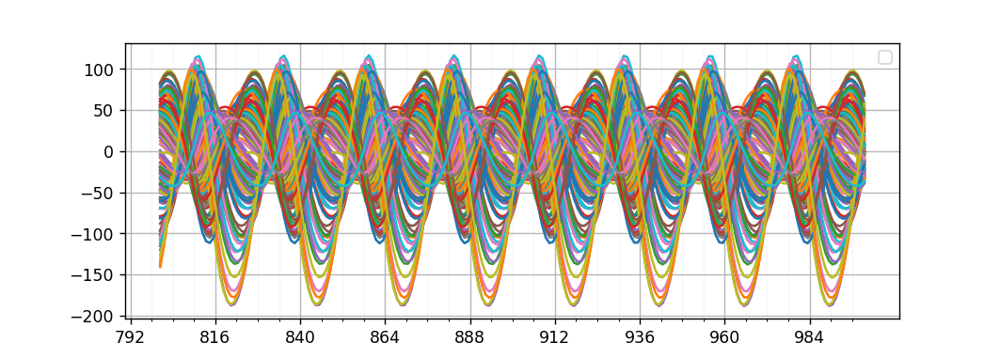

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


In [45]:
setAxis()
diff = cells.transpose(1,0,2)[3].transpose(1,0)-np.expand_dims(np.sum(cells.transpose(1,0,2)[3].transpose(1,0),1),1)/Nc
#cells -> sort by enzyme type -> take pn -> sort by time -> each entry are cells
i0 = 800
i1 = 1000
lines = plt.plot(SOL100SmallDiff.t[i0:i1], diff[i0:i1])
# plt.legend(iter(lines), range(Nc), loc = 1)g
plt.legend()
# plt.ylim(-700,800)
plt.show()

<IPython.core.display.Javascript object>


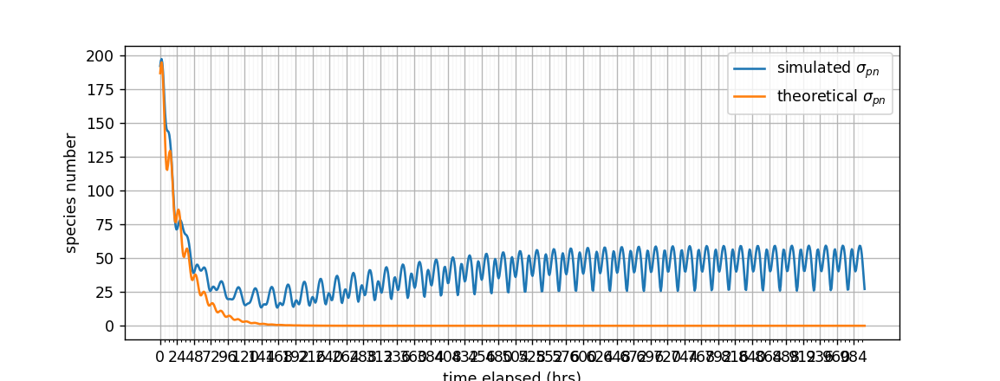

In [46]:
setAxis()
i0=0
i1=1000
sigms = [np.std(diff[i]) for i in range(i0, i1)]
plt.plot(SOL100SmallDiff.t[i0:i1], sigms,  label="simulated $\sigma_{pn}$")
t = SOL100SmallDiff.t[i0:i1]
# plt.plot(t, 200*(np.exp(-t*epm*0.25)))
plt.plot(t,np.sqrt(np.abs(35000+10000*np.sin(2*nu*t)))*(np.exp(-t*epm*0.25)), label="theoretical $\sigma_{pn}$")
plt.xlabel("time elapsed (hrs)")
plt.ylabel("species number")
l=plt.legend()
# plt.plot(t, np.exp(t*epm*0.25)*sigms/200)
# plt.plot(t, sigms-200*(np.exp(-t*epm*0.25)))
# plt.plot(t,100*((t*epm/8)*np.exp(-t*epm/4)) +200*(np.exp(-t*epm*0.25)))
# plt.plot(t,100*((t*epm*0.25)**2*np.exp(-2*t*epm*0.25)-(t*epm*0.25)*np.exp(-4*t*epm*0.25)) )
# plt.plot(t,200*(np.exp(-t*epm*0.25))+100*((t*epm*0.25)**2*np.exp(-2*t*epm*0.25)-(t*epm*0.25)*np.exp(-4*t*epm*0.25)))

In [31]:
print(epm)

0.09090909090909091


In [298]:
print(24*0.173*epm)

0.3774545454545454


In [193]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib import colors
from matplotlib.ticker import PercentFormatter
import numpy as np

import matplotlib.pyplot as plt
import matplotlib.animation as animation

<IPython.core.display.Javascript object>


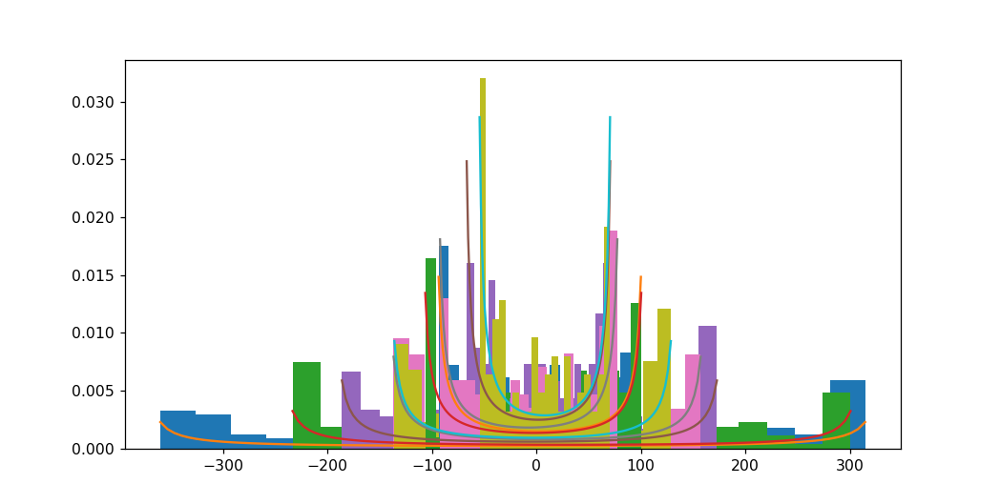

In [103]:
# A function plots the distribution of pn at anytime t
fig, axs = plt.subplots()
fig.show()
def plotdist (diff, t):
    snapshot = diff[int(t/t1*2000)]
    n_bins = 20
    ma = np.max(snapshot)
    mi = np.min(snapshot)
    # We can set the number of bins with the *bins* keyword argument.
    axs.hist(snapshot, bins=n_bins,  density=True)
    x = np.linspace(mi,ma,100)
    mu = (ma+mi)/2
    plt.plot(x, math.sqrt(ma-mi)/((ma-mu)*(ma-mu)-(x-mu)*(x-mu)*0.9))

t = 0
for i in  range(10):
    plotdist(diff, i*12)